In [4]:
import xarray as xr
import h5py
import glob
import os
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import cooler
import umap
from itertools import cycle, islice

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import LogNorm
from matplotlib import cm as cm
# import cooltools.lib.plotting

from scipy import ndimage as nd
from scipy.stats import pearsonr
from scipy.signal import find_peaks
from sklearn.decomposition import PCA
from statsmodels.sandbox.stats.multicomp import multipletests as FDR
from concurrent.futures import ProcessPoolExecutor, as_completed

In [5]:
# HiC basics metrices
# import core packages
import warnings
warnings.filterwarnings("ignore")
from itertools import combinations

# import semi-core packages
import matplotlib.pyplot as plt
from matplotlib import colors
%matplotlib inline
# plt.style.use('seaborn-poster')

# import open2c libraries
import bioframe
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [6]:
def compsaddle(cool): ### providing cool, calculate compartment, interaction in/between compartment (saddle plot)
    sad = np.zeros((50, 50))
    count = np.zeros((50, 50))
    comptmp = []
    for k,chrom in enumerate(chrom_sizes.index):
        Q = cool.matrix(balance=False, sparse=True).fetch(chrom).toarray()
        Q = Q - np.diag(np.diag(Q))
        pc = np.zeros(Q.shape[0])
        binfilter = binall[k]
        Q = Q[binfilter][:, binfilter]
        decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
        E = np.zeros(Q.shape)
        row, col = np.diag_indices(E.shape[0])
        E[row, col] = 1
        for i in range(1, E.shape[0]):
            E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
        E = E + E.T
        C = np.corrcoef(np.log2(E + 0.001))
        pc = (C-np.mean(C, axis=0)).dot(modelall[k])
        comptmp.append(pc)
        
        ### quantile split "eigen value", calculate interaction strength
        labels, groups = pd.qcut(pc, 50, labels=False, retbins=True)
        sad += np.array([[E[np.ix_(labels==i, labels==j)].sum() for i in range(50)] for j in range(50)])
        count += np.array([[(labels==i).sum()*(labels==j).sum() for i in range(50)] for j in range(50)])
    return np.concatenate(comptmp), sad, count

In [7]:
def compbulk(Qall, chrom_sizes, binall, cpg): ### providing bulk matrix by chrom, fit model for each chrom
    Call = []
    pcall = []
    modelall = []
    for k,chrom in enumerate(chrom_sizes.index):
        Q = Qall[k].copy()

        ### distance normalization
        print(f"start distance normalization for chrom {chrom}...")
        decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
        E = np.zeros(Q.shape)
        row, col = np.diag_indices(E.shape[0])
        E[row, col] = 1
        for i in range(1, E.shape[0]):
            E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
        E = E + E.T
        C = np.corrcoef(np.log2(E + 0.001))
        Call.append(C)
        binfilter = binall[k]
        
        ### PCA transform
        print("start PCA...")
        pca = PCA(n_components=2)
        pc = pca.fit_transform(C)
        cpgtmp = cpg.loc[cpg['chrom']==chrom, 'cpg_ratio'].values[binfilter]
        r = []
        for i in range(2):
            labels, groups = pd.qcut(pc[:,i], 50, labels=False, retbins=True)
            sad = np.array([[E[np.ix_(labels==i, labels==j)].sum() for i in range(50)] for j in range(50)])
            count = np.array([[(labels==i).sum()*(labels==j).sum() for i in range(50)] for j in range(50)])
            sad = sad / count
            r.append((sad[:10, :10].sum() + sad[-10:, -10:].sum()) / (sad[:10, -10:].sum() + sad[-10:, :10].sum()))

        ### the one more cor with GC ratio are A compartment
        if r[0]>r[1]:
            i = 0
        else:
            i = 1
        if pearsonr(cpgtmp, pc[:,i])[0]>0:
            pc = pc[:,i]
            modelall.append(pca.components_[i])
        else:
            pc = -pc[:,i]
            modelall.append(-pca.components_[i])
        pcall.append(pc)
    return Call, pcall, modelall

In [8]:
def pccluster(leg, cool_pattern, cpu = 8):
    sad = np.zeros((len(leg),50,50))
    count = np.zeros((len(leg),50,50))
    comp = []
    with ProcessPoolExecutor(cpu) as executor:
        futures = {}
        for t,ct in enumerate(leg):
            cool = cooler.Cooler(cool_pattern)
            future = executor.submit(
                compsaddle,
                cool=cool,
            )
            futures[future] = t

        for future in as_completed(futures):
            t = futures[future]
            ct = leg[t]
            xx, yy, zz = future.result()
            comp.append(pd.Series(xx, name=ct))
            sad[t] += yy
            count[t] += zz
            print(f'{ct} finished')
    return sad, count, comp

In [9]:
from matplotlib.ticker import EngFormatter
bp_formatter = EngFormatter('b')
def format_ticks(ax, x=True, y=True, rotate=True):
    if y:
        ax.yaxis.set_major_formatter(bp_formatter)
    if x:
        ax.xaxis.set_major_formatter(bp_formatter)
        ax.xaxis.tick_bottom()
    if rotate:
        ax.tick_params(axis='x',rotation=45)

# Visualize comparments score

### Bin filtering

In [94]:
chrom_size_path = '/projects/ps-renlab2/y2xie/projects/genome_ref/hg38.main.chrom.sizes'
chrom_sizes = cooler.read_chromsizes(chrom_size_path, all_names=True)
chrom_sizes = chrom_sizes[:23]
cpg = pd.read_hdf('/projects/ps-renlab2/y2xie/packages/scHiCluster/cpg/hg38_cpg_ratio_100k.hdf')

chr1
chr2
chr3
chr4
chr5
chr6
chr7
chr8
chr9
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr20
chr21
chr22
chrX


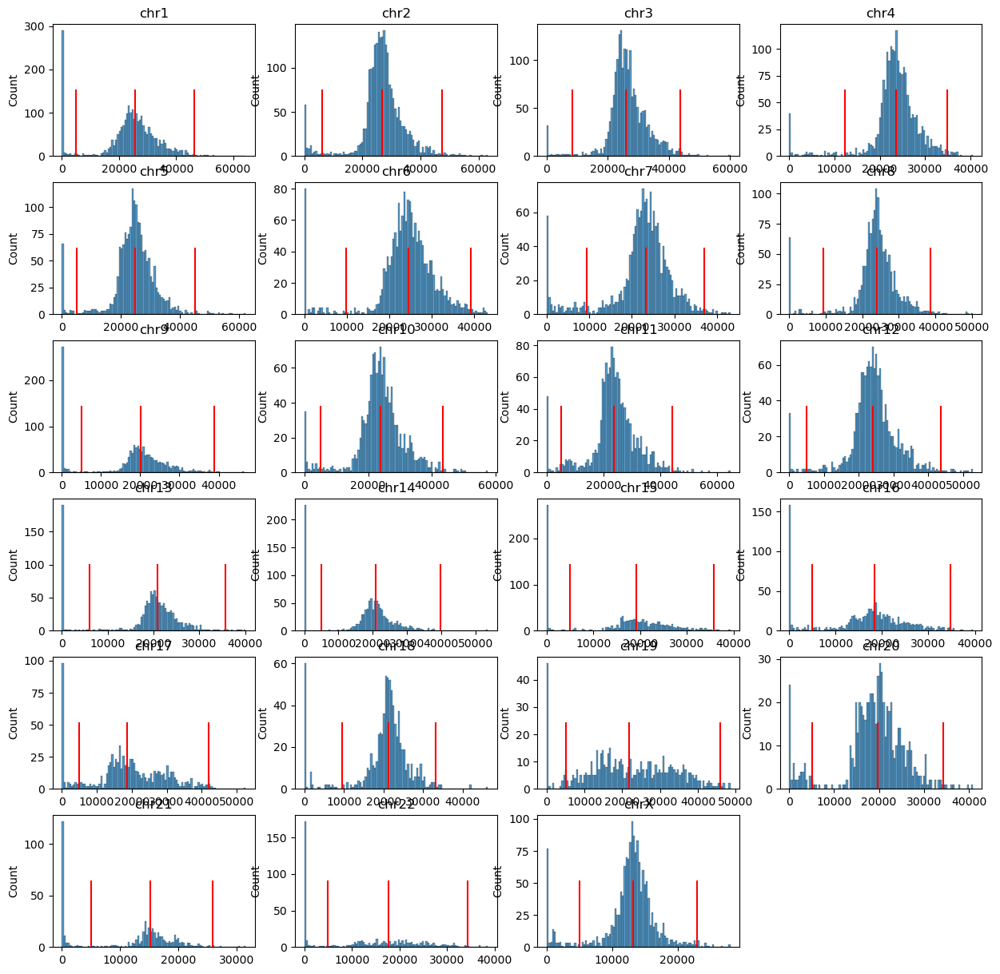

In [95]:
### in scHiCluster example: fit PC using merged raw matrices, then perform transformation 
Qall = []
binall = []

cool = cooler.Cooler(f'../04.matrices/FNIH_heart_dhc.mcool::resolutions/100000')
fig, axes = plt.subplots(6, 4, figsize=(15, 15))
for i,c in enumerate(chrom_sizes.index):
    Q = cool.matrix(balance=False, sparse=True).fetch(c).toarray()
    Q = Q - np.diag(np.diag(Q))
    
    ### covergae filtering
    rowsum = Q.sum(axis=0)
    thres = [np.percentile(rowsum[rowsum>0], 50), np.percentile(rowsum[rowsum>0], 99)]
    thres.append(thres[0]*2-thres[1])
    if thres[-1] < 5000:
        thres[-1] = 5000
    ax = axes.flatten()[i]
    sns.histplot(rowsum, bins=100, ax=ax)
    for t in thres:
        ax.plot([t, t], [0, ax.get_ylim()[1]*0.5], c='r')
    ax.set_title(c)
    binfilter = (rowsum>thres[-1])
    binall.append(binfilter)
    Q = Q[binfilter][:, binfilter]
    Qall.append(Q)
    print(c)

for i in range(chrom_sizes.shape[0], axes.flatten().shape[0]):
    axes.flatten()[i].axis('off')
    
np.save('../04.matrices/FNIH_heart_dhc_binfilter.npy', np.array(binall, dtype=object))

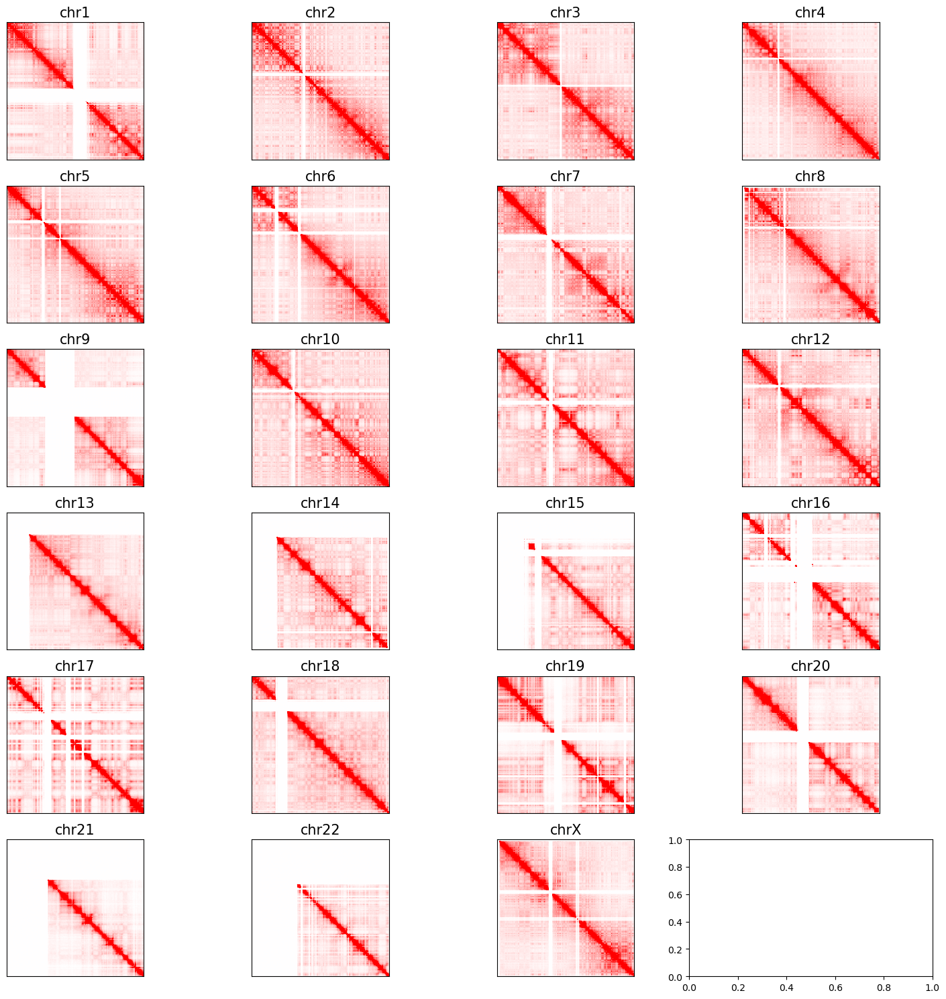

In [134]:
fig, axes = plt.subplots(6, 4, figsize=(15,15))
for i, c in enumerate(chrom_sizes.index):
    if np.unique(binall[i]).any():
        ax = axes.flatten()[i]
        n_bins = int(chrom_sizes[c] // 100000) + 1
        tmp = np.zeros((n_bins, n_bins))
        tmp[np.ix_(binall[i], binall[i])] = Qall[i]
        ax.imshow(tmp, cmap = 'bwr', vmin = -np.percentile(Qall[i], 95), vmax = np.percentile(Qall[i], 95))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(c, fontsize=15)

for i in range(chrom_sizes.shape[0], axes.flatten().shape[0]):
    axes.flatten()[i].axis('off')
    
plt.tight_layout()

### Get model: call compartment using bulk data 

In [135]:
Call, pcall, modelall = compbulk(Qall, chrom_sizes, binall, cpg)

start distance normalization for chrom chr1...
start PCA...
start distance normalization for chrom chr2...
start PCA...
start distance normalization for chrom chr3...
start PCA...
start distance normalization for chrom chr4...
start PCA...
start distance normalization for chrom chr5...
start PCA...
start distance normalization for chrom chr6...
start PCA...
start distance normalization for chrom chr7...
start PCA...
start distance normalization for chrom chr8...
start PCA...
start distance normalization for chrom chr9...
start PCA...
start distance normalization for chrom chr10...
start PCA...
start distance normalization for chrom chr11...
start PCA...
start distance normalization for chrom chr12...
start PCA...
start distance normalization for chrom chr13...
start PCA...
start distance normalization for chrom chr14...
start PCA...
start distance normalization for chrom chr15...
start PCA...
start distance normalization for chrom chr16...
start PCA...
start distance normalization for 

ValueError: Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required by PCA.

In [32]:
np.save("../04.matrices/FNIH_heart_dhc_bulk_model_all.npy", np.array(modelall, dtype=object))

In [15]:
len(modelall[1])

2316

In [122]:
# len(modelall)
# len(modelall[1])
len(pcall[2])

247

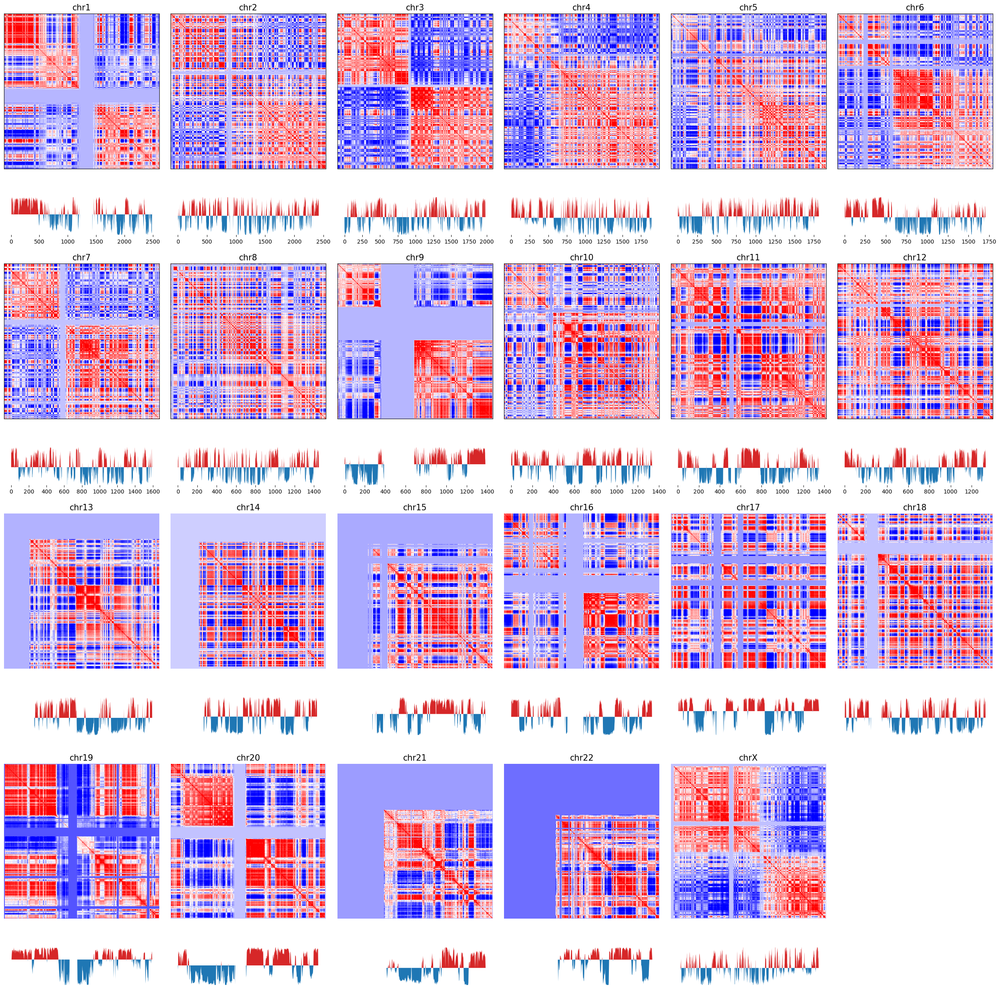

In [34]:
fig, axes = plt.subplots(8, 6, figsize=(25, 25), 
                         gridspec_kw={'height_ratios':[5,1,5,1,5,1,5,1]})
for i,c in enumerate(chrom_sizes.index[:-1]):
    nrow = 2*(i // 6)
    ncol = i % 6
    ax = axes[nrow, ncol]
    n_bins = int(chrom_sizes[c] // 100000) + 1
    tmp = np.zeros((n_bins, n_bins))
    tmp[np.ix_(binall[i], binall[i])] = Call[i]
    ax.imshow(tmp, cmap='bwr', vmin=np.percentile(Call[i], 5), vmax=np.percentile(Call[i], 95))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(c, fontsize=15)
    
    nrow = nrow + 1
    ax = axes[nrow, ncol]
    sns.despine(bottom=True, left=True, ax=ax)
    tmp = np.zeros(n_bins)
    tmp[binall[i]] = pcall[i]# / np.std(pcall[i]) ### either way is to normalize
    x, y = np.arange(n_bins), tmp
    # x, y = np.arange(pcall[i].shape[0]), pcall[i]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)
    ax.set_yticks([])
    ax.set_ylim([np.percentile(y, 1), np.percentile(y, 99)])

for i in range(chrom_sizes.shape[0], axes.flatten().shape[0]):
    axes.flatten()[i].axis('off')

plt.tight_layout()

In [36]:
np.save("../04.matrices/FNIH_heart_dhc_bulk_comp_raw.npy", np.array(pcall, dtype=object))

In [96]:
binall = np.load('../04.matrices/FNIH_heart_dhc_binfilter.npy', allow_pickle=True)
modelall = np.load("../04.matrices/FNIH_heart_dhc_bulk_model_all.npy", allow_pickle=True)
pcall = np.load("../04.matrices/FNIH_heart_dhc_bulk_comp_raw.npy", allow_pickle=True)

## Transform cell-type matrices using bulk model

In [7]:
### raw matrices
pca = PCA(n_components=2)

In [20]:
dmeta = pd.read_csv("integration/FNIH_DHC_genescore_prediction.metadata.csv")
leg = np.unique(dmeta['predicted.id'])

mode = 'raw'
res = 100000

In [44]:
sad = np.zeros((len(leg), 50, 50))
count = np.zeros((len(leg), 50, 50))
comp = []

cpu = 8
with ProcessPoolExecutor(cpu) as executor:
    futures = {}
    for t,ct in enumerate(leg):
        if mode == 'impute':
            cool = cooler.Cooler(f'../04.matrices/impute/{ct}_100kb.cool')
        elif mode == 'raw':
            cool = cooler.Cooler(f'../04.matrices/raw/cool/{ct}.mcool::resolutions/100000')
        future = executor.submit(
            compsaddle,
            cool=cool,
        )
        futures[future] = t

    for future in as_completed(futures):
        t = futures[future]
        ct = leg[t]
        xx, yy, zz = future.result()
        comp.append(pd.Series(xx, name=ct))
        sad[t] += yy
        count[t] += zz
        print(f'{ct} finished')
        
bins_df = cool.bins()[:]
bins_df.index = bins_df['chrom'].astype(str) + '-' + (bins_df['start'] // res).astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index)])

comp = pd.concat(comp, axis=1)
comp.index = compidx

### normalize
sad = sad / count

Epicardial finished
Adipocyte finished
Endocardial finished
Neuronal finished
Lymphoid finished
Myeloid finished
Endothelial finished
Fibroblast finished
SM finished
Pericyte finished
aCM finished
vCM finished


In [45]:
comp.to_hdf(f'../04.matrices/comp/FNIH_heart_dhc_celltype_comp.{mode}.hdf', key='data')
np.save(f'../04.matrices/comp/FNIH_heart_dhc_celltype_comp_saddle.{mode}.npy', np.array(sad, dtype=object))

In [46]:
ws = 10
compstr = [[sad[i][:ws, :ws].mean(), sad[i][-ws:, -ws:].mean(), sad[i][:ws, -ws:].mean(), sad[i][-ws:, :ws].mean(), 
            (sad[i][:ws, :ws].sum() + sad[i][-ws:, -ws:].sum()) / (sad[i][:ws, -ws:].sum() + sad[i][-ws:, :ws].sum())]
            for i in range(len(leg))]
compstr = pd.DataFrame(compstr, index=leg, columns=['BB', 'AA', 'BA', 'AB', 'strength'])
compstr.sort_values('strength')

,BB,AA,BA,AB,strength
vCM,1.268279,1.716867,0.555919,0.555919,2.684874
Fibroblast,1.413069,1.647376,0.536577,0.536577,2.851820
aCM,1.301451,1.789747,0.530453,0.530453,2.913733
Epicardial,1.459555,1.687360,0.478224,0.478224,3.290212
Adipocyte,1.245512,1.995996,0.481286,0.481286,3.367550
Pericyte,1.007758,2.458391,0.510689,0.510689,3.393604
SM,1.177401,2.199389,0.494813,0.494813,3.412188
Myeloid,1.187700,2.226867,0.499443,0.499443,3.418375
Neuronal,1.406066,2.068392,0.493836,0.493836,3.517826
Endothelial,1.013069,2.698652,0.510034,0.510034,3.638699


In [48]:
### is it related to cell counts
np.unique(dmeta['predicted.id'], return_counts=True)

(array(['Adipocyte', 'Endocardial', 'Endothelial', 'Epicardial',
        'Fibroblast', 'Lymphoid', 'Myeloid', 'Neuronal', 'Pericyte', 'SM',
        'aCM', 'vCM'], dtype=object),
 array([  512,  1160, 10971,   436, 21800,  2420,  9149,   953,  3331,
         1700,  7509,  9742]))

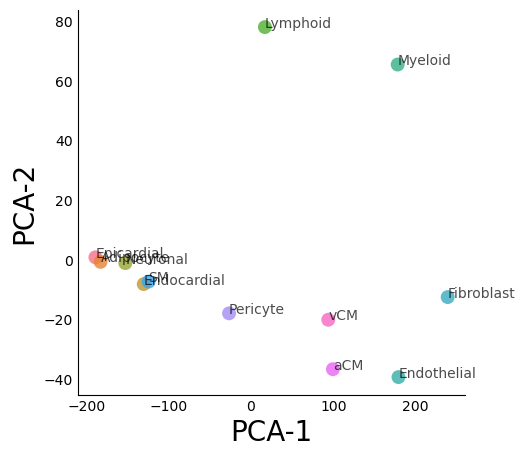

In [50]:
### PCA to check similarity
fig, axes = plt.subplots(figsize=(5,5))
yi = pca.fit_transform(comp.T)
sns.scatterplot(x = yi[:,0], y = yi[:,1], ax=axes, s=100, alpha=0.8, linewidth=0, hue=comp.columns.astype(str), legend=False)
for i, label in enumerate(comp.columns.astype(str)):
    plt.annotate(label, (yi[i][0], yi[i][1]), fontsize=10, alpha=0.7)

axes.set_xlabel('PCA-1', fontsize=20)
axes.set_ylabel('PCA-2', fontsize=20)
axes.spines['right'].set_visible(False)
axes.spines['top'].set_visible(False)
axes.tick_params(axis='both', which='both', length=0)

In [56]:
### Export compartment file in bed format
comp = pd.read_hdf("../04.matrices/comp/FNIH_heart_dhc_celltype_comp.raw.hdf")
bins_df.index = bins_df['chrom'].astype(str) + '-' + bins_df['start'].astype(str) + '-' + bins_df['end'].astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index)])
comp.index = compidx

for f in comp.columns:
    bedgraph_file = '../04.matrices/comp/raw/' + f + '_raw_comp.bedGraph'
    with open(bedgraph_file, 'w') as file:
        file.write('track type=bedGraph\n')
        for index, value in comp[f].items():
            chrom, start, end = index.split('-')
            file.write(f'{chrom}\t{start}\t{end}\t{value}\n')

## impute matrices

In [64]:
mode = "impute"
sad = np.zeros((len(leg), 50, 50))
count = np.zeros((len(leg), 50, 50))
comp = []

cpu = 8
with ProcessPoolExecutor(cpu) as executor:
    futures = {}
    for t,ct in enumerate(leg):
        if mode == 'impute':
            cool = cooler.Cooler(f'../04.matrices/impute/{ct}_100kb.cool')
        elif mode == 'raw':
            cool = cooler.Cooler(f'../04.matrices/raw/cool/{ct}.mcool::resolutions/100000')
        future = executor.submit(
            compsaddle,
            cool=cool,
        )
        futures[future] = t

    for future in as_completed(futures):
        t = futures[future]
        ct = leg[t]
        xx, yy, zz = future.result()
        comp.append(pd.Series(xx, name=ct))
        sad[t] += yy
        count[t] += zz
        print(f'{ct} finished')
        
bins_df = cool.bins()[:]
bins_df.index = bins_df['chrom'].astype(str) + '-' + bins_df['start'].astype(str) + '-' + bins_df['end'].astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index)])

comp = pd.concat(comp, axis=1)
comp.index = compidx

### normalize
sad = sad / count

Adipocyte finished
Myeloid finished
Fibroblast finished
Endocardial finished
Endothelial finished
Epicardial finished
Neuronal finished
Lymphoid finished
aCM finished
vCM finished
SM finished
Pericyte finished


In [67]:
comp.to_hdf(f'../04.matrices/comp/FNIH_heart_dhc_celltype_comp.{mode}.hdf', key='data')
np.save(f'../04.matrices/comp/FNIH_heart_dhc_celltype_comp_saddle.{mode}.npy', np.array(sad, dtype=object))

In [68]:
ws = 10
compstr = [[sad[i][:ws, :ws].mean(), sad[i][-ws:, -ws:].mean(), sad[i][:ws, -ws:].mean(), sad[i][-ws:, :ws].mean(), 
            (sad[i][:ws, :ws].sum() + sad[i][-ws:, -ws:].sum()) / (sad[i][:ws, -ws:].sum() + sad[i][-ws:, :ws].sum())]
            for i in range(len(leg))]
compstr = pd.DataFrame(compstr, index=leg, columns=['BB', 'AA', 'BA', 'AB', 'strength'])
compstr.sort_values('strength')

,BB,AA,BA,AB,strength
vCM,1.259204,1.579535,0.634023,0.634023,2.238673
Fibroblast,1.362531,1.521998,0.624500,0.624500,2.309469
aCM,1.294009,1.585676,0.614496,0.614496,2.343126
SM,1.174830,1.808201,0.608153,0.608153,2.452532
Adipocyte,1.256614,1.624028,0.586084,0.586084,2.457532
Epicardial,1.424438,1.491201,0.585519,0.585519,2.489789
Neuronal,1.321204,1.703606,0.605099,0.605099,2.499433
Pericyte,1.068543,2.019489,0.602724,0.602724,2.561730
Endothelial,1.061846,2.144206,0.605893,0.605893,2.645723
Endocardial,1.081682,2.073739,0.591881,0.591881,2.665589


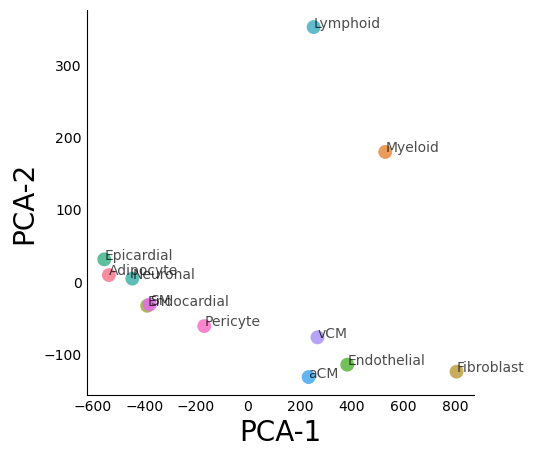

In [69]:
### PCA to check similarity
fig, axes = plt.subplots(figsize=(5,5))
yi = pca.fit_transform(comp.T)
sns.scatterplot(x = yi[:,0], y = yi[:,1], ax=axes, s=100, alpha=0.8, linewidth=0, hue=comp.columns.astype(str), legend=False)
for i, label in enumerate(comp.columns.astype(str)):
    plt.annotate(label, (yi[i][0], yi[i][1]), fontsize=10, alpha=0.7)

axes.set_xlabel('PCA-1', fontsize=20)
axes.set_ylabel('PCA-2', fontsize=20)
axes.spines['right'].set_visible(False)
axes.spines['top'].set_visible(False)
axes.tick_params(axis='both', which='both', length=0)

In [245]:
np.unique(dmeta['predicted.id'], return_counts=True)

(array(['Adipocyte', 'Endocardial', 'Endothelial', 'Epicardial',
        'Fibroblast', 'Lymphoid', 'Myeloid', 'Neuronal', 'Pericyte', 'SM',
        'aCM', 'vCM'], dtype=object),
 array([  400,   851, 10366,   351, 20442,  2065,  8684,   769,  2787,
         1127,  6529,  8719]))

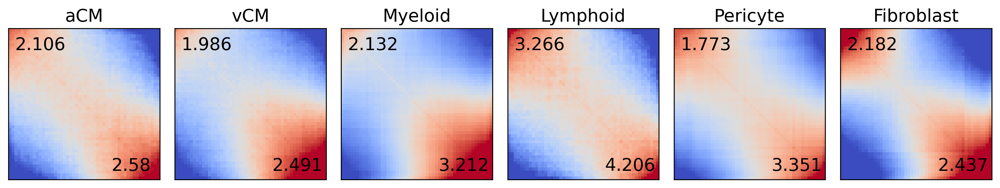

In [72]:
### Plot Saddle
leg_select = ['aCM', 'vCM', 'Myeloid', 'Lymphoid', 'Pericyte', 'Fibroblast']
vmin, vmax = -0.8, 0.8
fig, axes = plt.subplots(1, 6, figsize=(15,3), dpi=300)
fig.subplots_adjust(hspace=0.2, wspace=0.1)
for i,xx in enumerate(leg_select):
    ax = axes.flatten()[i]
    plot = ax.imshow(np.log2(sad[i]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
    # plot = ax.imshow(sad[i], cmap='coolwarm', vmin=0, vmax=2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(leg_select[i], fontsize=15)
    ax.text(40, 45, np.around(compstr.loc[xx, 'AA']/compstr.loc[xx, 'AB'], decimals=3), ha='center', va='center', fontsize=15)
    ax.text(10, 5, np.around(compstr.loc[xx, 'BB']/compstr.loc[xx, 'BA'], decimals=3), ha='center', va='center', fontsize=15)

for ax in axes.flatten()[len(leg):]:
    ax.axis('off')

In [92]:
binall = np.load('../04.matrices/FNIH_heart_dhc_binfilter.npy', allow_pickle = True)

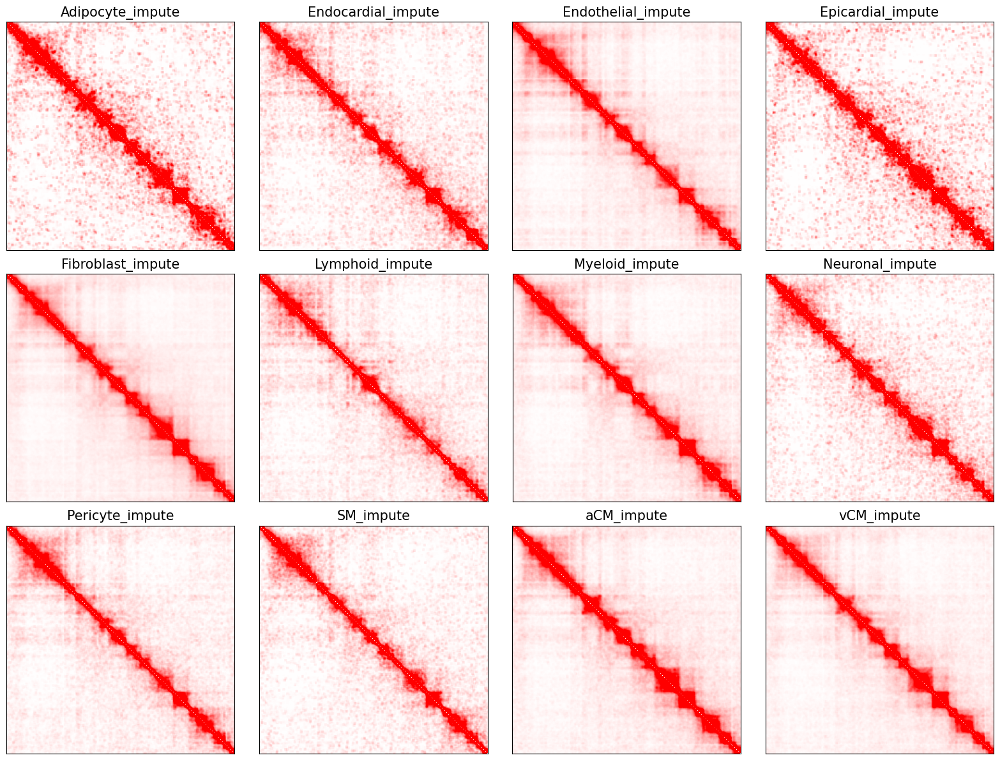

In [109]:
### Plot examples of compartment across clusters
chrom = 'chr1'
mode = 'impute'
l, r = 200_000_000, 225_000_000 ### 
res = 100_000
ll = int(l / res)
rr = int(r / res)
n_bins = (int(chrom_sizes.loc[chrom]) // res + 1)
Qall = []

fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for i, ct in enumerate(leg):
    binfilter = binall[0][ll:rr]
    ir = i // 4
    ic = i % 4
    ax = axes[ir, ic]
    if mode == 'impute':
        cool = cooler.Cooler(f'../04.matrices/impute/{ct}_100kb.cool')
    elif mode == 'raw':
        cool = cooler.Cooler(f'../04.matrices/raw/cool/{ct}.mcool::resolutions/100000')
    Q = cool.matrix(balance=False, sparse=True).fetch(chrom).toarray()
    Q = Q - np.diag(np.diag(Q))
    Q = Q[ll:rr, ll:rr]
    Q = Q[binfilter][:, binfilter]
    Qall.append(Q)
    # tmp = np.zeros((n_bins, n_bins))
    # tmp[np.ix_(binfilter, binfilter)] = Q
    ax.imshow(Q, cmap = 'bwr',vmin = -0.003, vmax = 0.003)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{ct}_impute', fontsize=15)

plt.tight_layout()

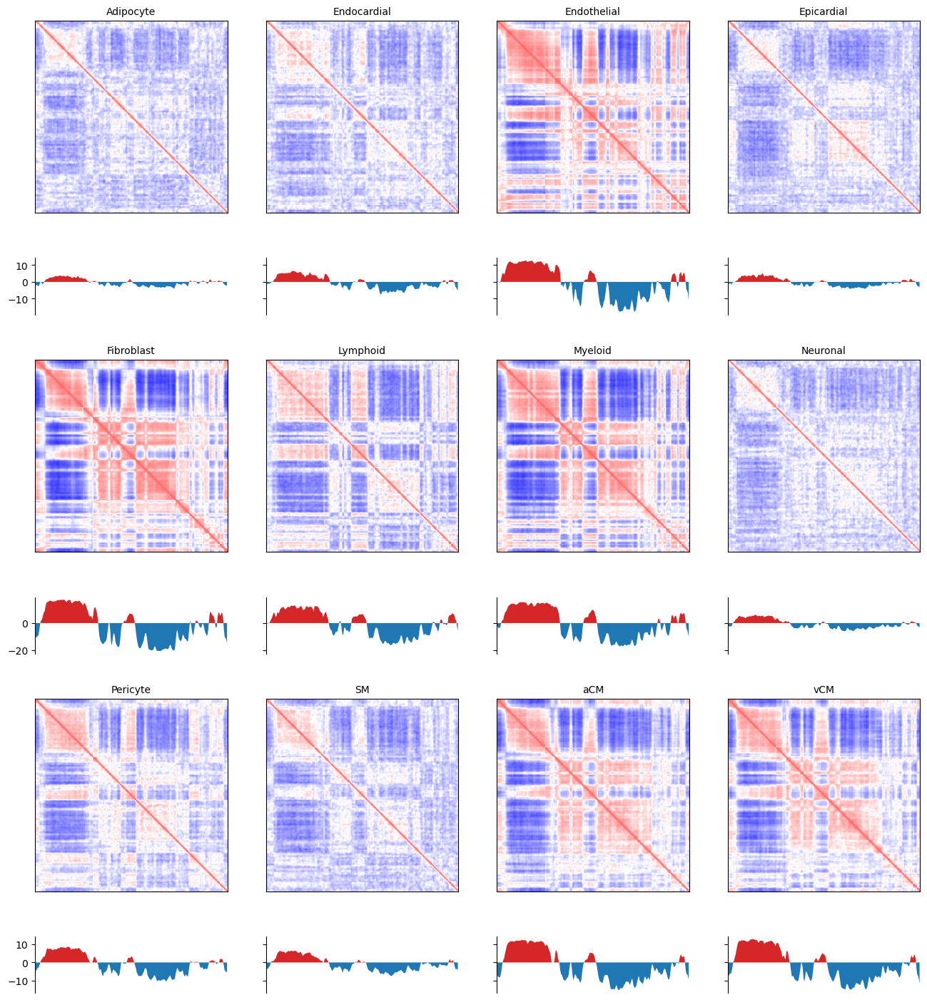

In [110]:
### Compare compartments
fig, axes = plt.subplots(6, 4, figsize=(16, 18), 
                         gridspec_kw={'height_ratios':[2, 0.5, 2, 0.5, 2, 0.5]}, sharex='col', sharey='row')

Call = []
pcall = []
for k, ct in enumerate(leg):
    binfilter = binall[0][ll:rr]
    ir = k // 4
    ic = k % 4
    ax = axes[2*ir, ic]
    Q = Qall[k].copy()
    decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
    E = np.zeros(Q.shape)
    row, col = np.diag_indices(E.shape[0])
    E[row, col] = 1
    for i in range(1, E.shape[0]):
        E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
    E = E + E.T
    C = np.corrcoef(np.log2(E + 0.001))
    Call.append(C)
    ax.imshow(C, cmap='bwr', vmin = -1, vmax = 1.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(ct, fontsize=10)
    
    ax = axes[2*ir+1, ic]
    sns.despine(bottom=True, ax=ax)
    tmp = comp.loc[(comp.index.str.split('-').str[0] == chrom) & (comp.index.str.split('-').str[1].astype(int) >= ll*res) & (comp.index.str.split('-').str[1].astype(int) < rr*res), ct]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    pcall.append(tmp.values) ### tmp.iloc[np.where(binfilter)[0]].values
    # tmp = np.zeros(n_bins)
    # tmp[binfilter] = pcall[k]
    x, y = np.arange(len(pcall[k])), pcall[k]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)

In [83]:
for f in comp.columns:
    bedgraph_file = '../04.matrices/comp/impute/' + f + '_impute_comp.bedGraph'
    with open(bedgraph_file, 'w') as file:
        file.write('track type=bedGraph\n')
        for index, value in comp[f].items():
            chrom, start, end = index.split('-')
            file.write(f'{chrom}\t{start}\t{end}\t{value}\n')

## Differential compartments with dchic

In [2]:
leg

NameError: name 'leg' is not defined

In [85]:
comp = pd.read_hdf("../04.matrices/comp/FNIH_heart_dhc_celltype_comp.impute.hdf")
outdir = '../04.matrices/comp/impute/dchic/'

res = 100_000
binall = pd.DataFrame(index=comp.index)
binall['chrom'] = binall.index.str.split('-').str[0]
binall['start'] = binall.index.str.split('-').str[1].astype(int) 
binall['end'] = binall.index.str.split('-').str[2].astype(int)

for xx in leg:
    os.makedirs(f'{outdir}/{xx}_100Kb_pca/intra_pca/{xx}_100Kb_mat/', exist_ok=True)
    tmp = binall.copy()
    tmp['pc'] = comp[xx]
    for c in chrom_sizes.index[:-1]:
        tmp.loc[tmp['chrom']==c].to_csv(f'{outdir}/{xx}_100Kb_pca/intra_pca/{xx}_100Kb_mat/{c}.pc.bedGraph', sep='\t', header=False, index=False)

In [86]:
tmp = pd.DataFrame(index=leg)
tmp['matrix_path'] = '.'
tmp['bed_path'] = '.'
tmp['sample'] = tmp.index + '_100Kb'
tmp['group'] = tmp.index
tmp.to_csv(f'{outdir}/input.txt', sep='\t', header=False, index=False)

In [ ]:
### dchic
# Rscript /projects/ps-renlab2/y2xie/packages/dcHiC/dchicf.r --file input.txt --pcatype analyze --dirovwt T --diffdir .

## Compartments in disease: is there global changes?

In [97]:
import pyreadr
dmeta = pyreadr.read_r('integration/All_data.int.meta.rds')
dmeta = dmeta[None]
dmeta = dmeta.loc[dmeta['orig.ident'] == 'DHC']
dmeta['disease'] = dmeta['predicted.id'] + "_" + dmeta['condition'] 
dmeta['disease2'] = dmeta['predicted.id'] + "_" + dmeta['HF'] 
leg = np.unique(dmeta['disease2'])
leg

array(['Adipocyte_CONTROL', 'Adipocyte_Ischemic',
       'Adipocyte_Non-ischemic', 'Endocardial_CONTROL',
       'Endocardial_Ischemic', 'Endocardial_Non-ischemic',
       'Endothelial_CONTROL', 'Endothelial_Ischemic',
       'Endothelial_Non-ischemic', 'Epicardial_CONTROL',
       'Epicardial_Ischemic', 'Epicardial_Non-ischemic',
       'Fibroblast_CONTROL', 'Fibroblast_Ischemic',
       'Fibroblast_Non-ischemic', 'Lymphoid_CONTROL', 'Lymphoid_Ischemic',
       'Lymphoid_Non-ischemic', 'Myeloid_CONTROL', 'Myeloid_Ischemic',
       'Myeloid_Non-ischemic', 'Neuronal_CONTROL', 'Neuronal_Ischemic',
       'Neuronal_Non-ischemic', 'Pericyte_CONTROL', 'Pericyte_Ischemic',
       'Pericyte_Non-ischemic', 'SM_CONTROL', 'SM_Ischemic',
       'SM_Non-ischemic', 'aCM_CONTROL', 'aCM_Ischemic',
       'aCM_Non-ischemic', 'vCM_CONTROL', 'vCM_Ischemic',
       'vCM_Non-ischemic'], dtype=object)

In [98]:
### Dont mind control
leg = [x for x in leg if "CONTROL" not in x]

In [99]:
mode = "impute"
sad = np.zeros((len(leg), 50, 50))
count = np.zeros((len(leg), 50, 50))
comp = []

cpu = 8
with ProcessPoolExecutor(cpu) as executor:
    futures = {}
    for t,ct in enumerate(leg):
        if mode == 'impute':
            cool = cooler.Cooler(f'../04.matrices/impute/cool/{ct}_100kb.cool')
        elif mode == 'raw':
            cool = cooler.Cooler(f'../04.matrices/raw/cool/{ct}.mcool::resolutions/100000')
        future = executor.submit(
            compsaddle,
            cool=cool,
        )
        futures[future] = t

    for future in as_completed(futures):
        t = futures[future]
        ct = leg[t]
        xx, yy, zz = future.result()
        comp.append(pd.Series(xx, name=ct))
        sad[t] += yy
        count[t] += zz
        print(f'{ct} finished')
        
bins_df = cool.bins()[:]
bins_df.index = bins_df['chrom'].astype(str) + '-' + bins_df['start'].astype(str) + '-' + bins_df['end'].astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index)])

comp = pd.concat(comp, axis=1)
comp.index = compidx

### normalize
sad = sad / count

Epicardial_Ischemic finished
Endocardial_Ischemic finished
Adipocyte_Non-ischemic finished
Endocardial_Non-ischemic finished
Adipocyte_Ischemic finished
Endothelial_Non-ischemic finished
Fibroblast_Non-ischemic finished
Fibroblast_Ischemic finished
Endothelial_Ischemic finished
Epicardial_Non-ischemic finished
Lymphoid_Ischemic finished
Lymphoid_Non-ischemic finished
Neuronal_Ischemic finished
Neuronal_Non-ischemic finished
Myeloid_Ischemic finished
Myeloid_Non-ischemic finished
Pericyte_Ischemic finished
Pericyte_Non-ischemic finished
SM_Ischemic finished
SM_Non-ischemic finished
aCM_Ischemic finished
vCM_Ischemic finished
vCM_Non-ischemic finished
aCM_Non-ischemic finished


In [100]:
comp.to_csv(f'../04.matrices/comp/FNIH_heart_dhc_celltype_HF_comp.{mode}.ICM.csv')
np.save(f'../04.matrices/comp/FNIH_heart_dhc_celltype_saddle.{mode}.ICM.npy', sad)

In [103]:
comp2 = pd.read_csv(f'../04.matrices/comp/FNIH_heart_dhc_celltype_HF_comp.{mode}.csv', index_col=0)
comp = pd.concat([comp, comp2], axis=1)
comp = comp.dropna()

In [23]:
# mode = 'impute'
# sad = np.load(f'../04.matrices/comp/FNIH_heart_dhc_celltype_saddle.{mode}.ICM.npy')

In [131]:
subdir='dchic_HF'

In [128]:
res = 100_000
binall = pd.DataFrame(index=comp.index)
binall['chrom'] = binall.index.str.split('-').str[0]
binall['start'] = binall.index.str.split('-').str[1].astype(int) 
binall['end'] = binall.index.str.split('-').str[2].astype(int)

for xx in comp.columns:
    yy = xx.replace('-', '_')
    os.makedirs(f'../04.matrices/comp/impute/disease/{subdir}/{yy}_100Kb_pca/intra_pca/{yy}_100Kb_mat/', exist_ok=True)
    tmp = binall.copy()
    tmp['pc'] = comp[xx]
    for c in chrom_sizes.index[:-1]: ### euchromsome only
        tmp.loc[tmp['chrom']==c].to_csv(f'../04.matrices/comp/impute/disease/{subdir}/{yy}_100Kb_pca/intra_pca/{yy}_100Kb_mat/{c}.pc.bedGraph', 
                                        sep='\t', header=False, index=False)

In [110]:
for xx in comp.columns:
    yy = xx.replace('-', '_')
    bedgraph_file = f'../04.matrices/comp/impute/disease/{subdir}/' + yy + '_impute_comp.bedGraph'
    with open(bedgraph_file, 'w') as file:
        file.write('track type=bedGraph\n')
        for index, value in comp[xx].items():
            chrom, start, end = index.split('-')
            file.write(f'{chrom}\t{start}\t{end}\t{value}\n')

In [130]:
tmp = pd.DataFrame(index=[xx.replace('-', '_') for xx in comp.columns])
tmp['matrix_path'] = '.'
tmp['bed_path'] = '.'
tmp['sample'] = tmp.index + '_100Kb'
tmp['group'] = tmp.index
tmp.to_csv(f'../04.matrices/comp/impute/disease/{subdir}/input.txt', sep='\t', header=False, index=False)

### Compare compartment strength

In [36]:
ws = 10
compstr = [[sad[i][:ws, :ws].mean(), sad[i][-ws:, -ws:].mean(), sad[i][:ws, -ws:].mean(), sad[i][-ws:, :ws].mean(), 
            (sad[i][:ws, :ws].sum() + sad[i][-ws:, -ws:].sum()) / (sad[i][:ws, -ws:].sum() + sad[i][-ws:, :ws].sum())]
            for i in range(len(leg))]
compstr = pd.DataFrame(compstr, index=leg, columns=['BB', 'AA', 'BA', 'AB', 'strength'])
compstr.to_csv(f'../04.matrices/comp/FNIH_heart_dhc_celltype_HF_compstr.{mode}.ICM.csv')
# compstr = pd.read_csv(f'../04.matrices/comp/FNIH_heart_dhc_celltype_HF_compstr.{mode}.csv', index_col=0)

In [42]:
compstr2 = pd.read_csv(f'../04.matrices/comp/FNIH_heart_dhc_celltype_HF_compstr.{mode}.csv', index_col=0)
compstr = pd.concat([compstr, compstr2], axis = 0)

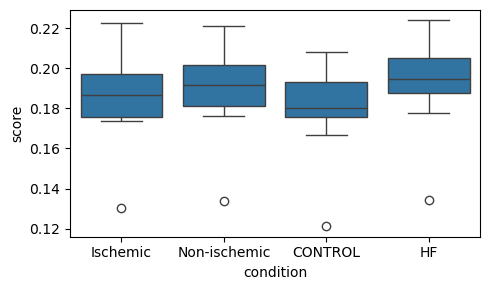

In [50]:
compfuse = pd.DataFrame(compstr['AB']/(compstr['AA'] + compstr['BB']), columns=['score'])
compfuse[['celltype', 'condition']] = compfuse.index.to_series().str.split('_', expand = True)

fig, ax = plt.subplots(figsize=(5, 3), sharex='all')
sns.boxplot(data=compfuse, x='condition', y='score', ax=ax)
plt.tight_layout()

In [80]:
from scipy.stats import wilcoxon  

g1 = compfuse.loc[compfuse["condition"] == "Ischemic", "score"].dropna().to_numpy()
g2 = compfuse.loc[compfuse["condition"] == "Non-ischemic", "score"].dropna().to_numpy()
u_stat, pval = wilcoxon(g1, g2, alternative="two-sided",)
print(f"ICM vs NICM: {pval}")

g1 = compfuse.loc[compfuse["condition"] == "Ischemic", "score"].dropna().to_numpy()
g2 = compfuse.loc[compfuse["condition"] == "CONTROL", "score"].dropna().to_numpy()
u_stat, pval = wilcoxon(g1, g2, alternative="two-sided",)
print(f"ICM vs CONTROL: {pval}")

g1 = compfuse.loc[compfuse["condition"] == "CONTROL", "score"].dropna().to_numpy()
g2 = compfuse.loc[compfuse["condition"] == "Non-ischemic", "score"].dropna().to_numpy()
u_stat, pval = wilcoxon(g1, g2, alternative="two-sided",)
print(f"NICM vs CONTROL: {pval}")

g1 = compfuse.loc[compfuse["condition"] == "CONTROL", "score"].dropna().to_numpy()
g2 = compfuse.loc[compfuse["condition"] == "HF", "score"].dropna().to_numpy()
u_stat, pval = wilcoxon(g1, g2, alternative="two-sided",)
print(f"HF vs CONTROL: {pval}")

ICM vs NICM: 0.0341796875
ICM vs CONTROL: 0.10986328125
NICM vs CONTROL: 0.0771484375
HF vs CONTROL: 0.01220703125


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 45 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'F', 'I', 'L', 'M', 'N', 'P', 'S', 'a', 'b', 'c', 'd', 'e', 'eight', 'five', 'four', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 38, 40, 41, 44, 47, 48, 49, 51, 54, 66, 68, 69, 70, 71, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
INFO:

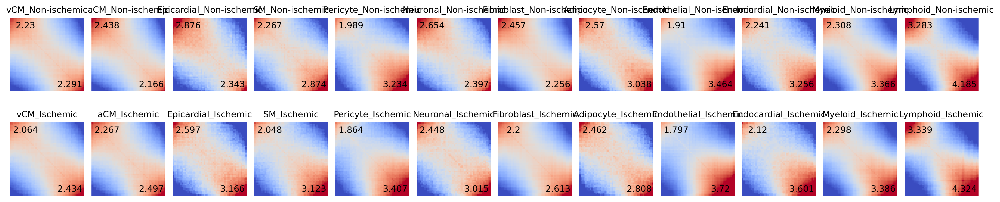

In [75]:
corder = ['vCM','aCM','Epicardial','SM','Pericyte','Neuronal','Fibroblast',
          'Adipocyte','Endothelial','Endocardial','Myeloid','Lymphoid']
vmin, vmax = -0.8, 0.8
fig, axes = plt.subplots(2, 12, figsize=(20, 4), dpi=300)
fig.subplots_adjust(hspace=0.2, wspace=0.1)

for i, xx in enumerate(corder):
    ax = axes[0, i]
    yy = xx + '_Non-ischemic'
    plot = ax.imshow(np.log2(sad[np.where(np.char.strip(leg) == yy)][0]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(yy, fontsize=10)
    ax.text(40, 45, np.around(compstr.loc[yy, 'AA']/compstr.loc[yy, 'AB'], decimals=3), ha='center', va='center', fontsize=10)
    ax.text(10, 5, np.around(compstr.loc[yy, 'BB']/compstr.loc[yy, 'BA'], decimals=3), ha='center', va='center', fontsize=10)
    ax.axis('off')
    
    ax = axes[1, i]
    yy = xx + '_Ischemic'
    plot = ax.imshow(np.log2(sad[np.where(np.char.strip(leg) == yy)][0]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(yy, fontsize=10)
    ax.text(40, 45, np.around(compstr.loc[yy, 'AA']/compstr.loc[yy, 'AB'], decimals=3), ha='center', va='center', fontsize=10)
    ax.text(10, 5, np.around(compstr.loc[yy, 'BB']/compstr.loc[yy, 'BA'], decimals=3), ha='center', va='center', fontsize=10)
    ax.axis('off')
    
#     ax = axes[2, i]
#     yy = xx + '_Non-ischemic'
#     plot = ax.imshow(np.log2(sad[np.where(leg == yy)][0]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
#     ax.set_xticks([])
#     ax.set_yticks([])
#     ax.set_title(yy, fontsize=10)
#     ax.text(40, 45, np.around(compstr.loc[yy, 'AA']/compstr.loc[yy, 'AB'], decimals=3), ha='center', va='center', fontsize=10)
#     ax.text(10, 5, np.around(compstr.loc[yy, 'BB']/compstr.loc[yy, 'BA'], decimals=3), ha='center', va='center', fontsize=10)
#     ax.axis('off')
    
#     ax = axes[3, i]
#     yy = xx + '_Ischemic'
#     plot = ax.imshow(np.log2(sad[np.where(leg == yy)][0]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
#     ax.set_xticks([])
#     ax.set_yticks([])
#     ax.set_title(yy, fontsize=10)
#     ax.text(40, 45, np.around(compstr.loc[yy, 'AA']/compstr.loc[yy, 'AB'], decimals=3), ha='center', va='center', fontsize=10)
#     ax.text(10, 5, np.around(compstr.loc[yy, 'BB']/compstr.loc[yy, 'BA'], decimals=3), ha='center', va='center', fontsize=10)
#     ax.axis('off')

plt.savefig(f'plot/FIG_CONTROL_vs_HF_saddle_allct_ICM_NICM.pdf')

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 40 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'C', 'E', 'F', 'H', 'L', 'M', 'N', 'O', 'R', 'T', 'a', 'b', 'd', 'e', 'eight', 'five', 'four', 'h', 'i', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 40, 41, 43, 47, 48, 49, 50, 53, 55, 66, 68, 69, 71, 72, 75, 76, 79, 81, 82, 85, 86, 87, 89, 92]
INFO:fontTools.subset:Closed glyph list over 'MATH': 40

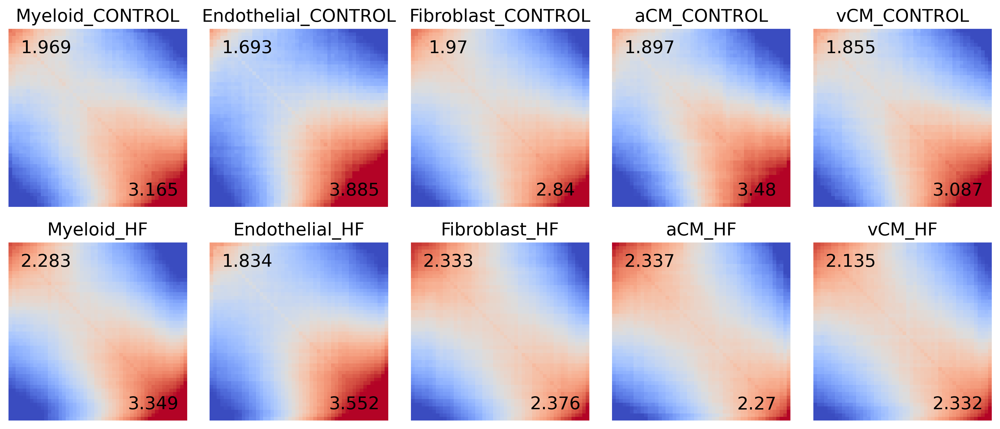

In [37]:
# leg_select = ['Epicardial_CONTROL', 'Epicardial_HF', 'vCM_CONTROL', 'vCM_HF', 'Myeloid_CONTROL', 'Myeloid_HF']
leg_select = ['Myeloid', 'Endothelial', 'Fibroblast', 'aCM', 'vCM']
vmin, vmax = -0.8, 0.8
fig, axes = plt.subplots(2, 5, figsize=(15, 6), dpi=300)
fig.subplots_adjust(hspace=0.2, wspace=0.1)

for i, xx in enumerate(leg_select):
    ax = axes[0, i]
    yy = xx + '_CONTROL'
    plot = ax.imshow(np.log2(sad[np.where(leg == yy)][0]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(yy, fontsize=15)
    ax.text(40, 45, np.around(compstr.loc[yy, 'AA']/compstr.loc[yy, 'AB'], decimals=3), ha='center', va='center', fontsize=15)
    ax.text(10, 5, np.around(compstr.loc[yy, 'BB']/compstr.loc[yy, 'BA'], decimals=3), ha='center', va='center', fontsize=15)
    ax.axis('off')
    
    ax = axes[1, i]
    yy = xx + '_HF'
    plot = ax.imshow(np.log2(sad[np.where(leg == yy)][0]+0.001), cmap='coolwarm', vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(yy, fontsize=15)
    ax.text(40, 45, np.around(compstr.loc[yy, 'AA']/compstr.loc[yy, 'AB'], decimals=3), ha='center', va='center', fontsize=15)
    ax.text(10, 5, np.around(compstr.loc[yy, 'BB']/compstr.loc[yy, 'BA'], decimals=3), ha='center', va='center', fontsize=15)
    ax.axis('off')

plt.savefig(f'plot/FIG_CONTROL_vs_HF_saddle_examples.pdf')

In [82]:
comp.columns

Index(['Adipocyte_Ischemic', 'Endocardial_Ischemic', 'Adipocyte_Non-ischemic',
       'Endothelial_Ischemic', 'Epicardial_Ischemic',
       'Epicardial_Non-ischemic', 'Endocardial_Non-ischemic',
       'Endothelial_Non-ischemic', 'Fibroblast_Non-ischemic',
       'Myeloid_Ischemic', 'Fibroblast_Ischemic', 'Lymphoid_Non-ischemic',
       'Lymphoid_Ischemic', 'Neuronal_Ischemic', 'Myeloid_Non-ischemic',
       'Neuronal_Non-ischemic', 'Pericyte_Ischemic', 'Pericyte_Non-ischemic',
       'SM_Ischemic', 'aCM_Ischemic', 'SM_Non-ischemic', 'vCM_Ischemic',
       'vCM_Non-ischemic', 'aCM_Non-ischemic', 'Adipocyte_HF',
       'Epicardial_CONTROL', 'Epicardial_HF', 'Endocardial_HF',
       'Endothelial_CONTROL', 'Endocardial_CONTROL', 'Adipocyte_CONTROL',
       'Endothelial_HF', 'Lymphoid_CONTROL', 'Myeloid_CONTROL',
       'Fibroblast_CONTROL', 'Lymphoid_HF', 'Myeloid_HF', 'Neuronal_CONTROL',
       'Fibroblast_HF', 'Neuronal_HF', 'Pericyte_CONTROL', 'aCM_CONTROL',
       'aCM_HF', 'SM_HF', '

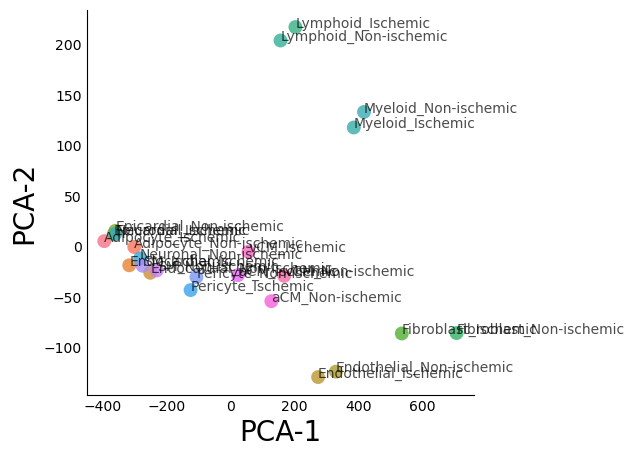

In [84]:
pca = PCA(n_components=2)
# leg_select = ['Epicardial_CONTROL', 'Epicardial_HF', 'aCM_CONTROL', 'aCM_HF', 'vCM_CONTROL', 'vCM_HF', 'Myeloid_CONTROL', 'Myeloid_HF']
tmp = comp[leg]

fig, axes = plt.subplots(figsize=(5,5))
yi = pca.fit_transform(tmp.T)
sns.scatterplot(x = yi[:,0], y = yi[:,1], ax=axes, s=100, alpha=0.8, linewidth=0, 
                hue=tmp.columns.astype(str), legend=False)
for i, label in enumerate(tmp.columns.astype(str)):
    plt.annotate(label, (yi[i][0], yi[i][1]), fontsize=10, alpha=0.7)

axes.set_xlabel('PCA-1', fontsize=20)
axes.set_ylabel('PCA-2', fontsize=20)
axes.spines['right'].set_visible(False)
axes.spines['top'].set_visible(False)
axes.tick_params(axis='both', which='both', length=0)

In [ ]:
### Compare top 25% comp interaction (A-A and B-B, HF vs Control)


In [ ]:
### Compare compartments: CONTROL vs HF
fig, axes = plt.subplots(6, 4, figsize=(16, 18), 
                         gridspec_kw={'height_ratios':[2, 0.5, 2, 0.5, 2, 0.5]}, sharex='col', sharey='row')

Call = []
pcall = []
for k, ct in enumerate(leg):
    binfilter = binall[0][ll:rr]
    ir = k // 4
    ic = k % 4
    ax = axes[2*ir, ic]
    Q = Qall[k].copy()
    decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
    E = np.zeros(Q.shape)
    row, col = np.diag_indices(E.shape[0])
    E[row, col] = 1
    for i in range(1, E.shape[0]):
        E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
    E = E + E.T
    C = np.corrcoef(np.log2(E + 0.001))
    Call.append(C)
    ax.imshow(C, cmap='bwr', vmin = -1, vmax = 1.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(ct, fontsize=10)
    
    ax = axes[2*ir+1, ic]
    sns.despine(bottom=True, ax=ax)
    tmp = comp.loc[(comp.index.str.split('-').str[0] == chrom) & (comp.index.str.split('-').str[1].astype(int) >= ll*res) & (comp.index.str.split('-').str[1].astype(int) < rr*res), ct]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    pcall.append(tmp.values) ### tmp.iloc[np.where(binfilter)[0]].values
    # tmp = np.zeros(n_bins)
    # tmp[binfilter] = pcall[k]
    x, y = np.arange(len(pcall[k])), pcall[k]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)

In [10]:
### in scHiCluster example: fit PC using merged raw matrices, then perform transformation 
ct = 'vCM'

Qall1 = []
Qall2 = []
cool1 = cooler.Cooler(f'../04.matrices/impute/cool/{ct}_CONTROL_100kb.cool::/')
cool2 = cooler.Cooler(f'../04.matrices/impute/cool/{ct}_HF_100kb.cool::/')

for i,c in enumerate(chrom_sizes.index):
    Q = cool1.matrix(balance=False, sparse=True).fetch(c).toarray()
    Q = Q - np.diag(np.diag(Q))
    
    ### covergae filtering
    binfilter = binall[i]
    Q = Q[binfilter][:, binfilter]
    Qall1.append(Q)
    
    Q = cool2.matrix(balance=False, sparse=True).fetch(c).toarray()
    Q = Q - np.diag(np.diag(Q))
    binfilter = binall[i]
    Q = Q[binfilter][:, binfilter]
    Qall2.append(Q)
    
    print(c)

chr1
chr2
chr3
chr4
chr5
chr6
chr7
chr8
chr9
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr20
chr21
chr22


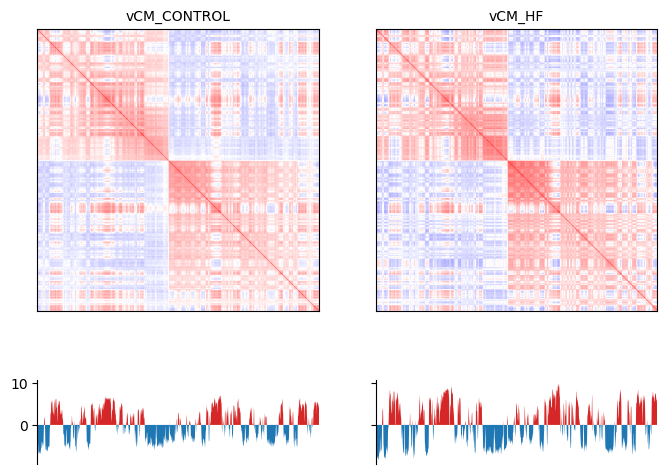

In [12]:
### Compare compartments
comp = pd.read_csv("../04.matrices/comp/FNIH_heart_dhc_celltype_HF_comp.impute.csv", index_col = 0)

fig, axes = plt.subplots(2, 2, figsize=(8, 6), 
                         gridspec_kw={'height_ratios':[2, 0.5]}, sharex='col', sharey='row')

Call = []
pcall = []
for k, ctt in enumerate([f'{ct}_CONTROL', f'{ct}_HF']):
    binfilter = binall[2]
    ir = k // 2
    ic = k % 2
    ax = axes[2*ir, ic]
    Q = [Qall1, Qall2][k][2].copy()
    decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
    E = np.zeros(Q.shape)
    row, col = np.diag_indices(E.shape[0])
    E[row, col] = 1
    for i in range(1, E.shape[0]):
        E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
    E = E + E.T
    C = np.corrcoef(np.log2(E + 0.001))
    Call.append(C)
    ax.imshow(C, cmap='bwr', vmin = -1, vmax = 1)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(ctt, fontsize=10)
    
    ax = axes[2*ir+1, ic]
    sns.despine(bottom=True, ax=ax)
    tmp = comp.loc[(comp.index.str.split('-').str[0] == "chr3"), ctt]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    pcall.append(tmp.values) ### tmp.iloc[np.where(binfilter)[0]].values
    
    x, y = np.arange(len(pcall[k])), pcall[k]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)

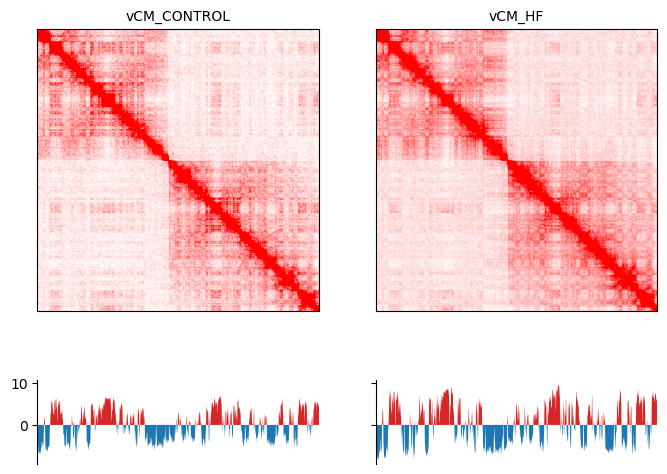

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(8, 6), 
                         gridspec_kw={'height_ratios':[2, 0.5]}, sharex='col', sharey='row')

Call = []
pcall = []
for k, ctt in enumerate([f'{ct}_CONTROL', f'{ct}_HF']):
    binfilter = binall[2]
    ir = k // 2
    ic = k % 2
    ax = axes[2*ir, ic]
    Q = [Qall1, Qall2][k][2].copy()
    ax.imshow(Q, cmap='bwr', vmin = -0.0003, vmax = 0.0003)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(ctt, fontsize=10)
    
    ax = axes[2*ir+1, ic]
    sns.despine(bottom=True, ax=ax)
    tmp = comp.loc[(comp.index.str.split('-').str[0] == "chr3"), ctt]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    pcall.append(tmp.values) ### tmp.iloc[np.where(binfilter)[0]].values
    
    x, y = np.arange(len(pcall[k])), pcall[k]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 25 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'C', 'F', 'H', 'L', 'M', 'N', 'O', 'R', 'T', 'b', 'five', 'four', 'minus', 'nonmarkingreturn', 'one', 'period', 'seven', 'six', 'space', 'two', 'underscore', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 25, 26, 38, 41, 43, 47, 48, 49, 50, 53, 55, 66, 69, 89, 3228]
INFO:fontTools.subset:Closed glyph list over 'MATH': 25 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'C', 'F', 'H', 'L', 'M', 'N', 'O', 'R', 'T', 'b', 'five', 'four', 'min

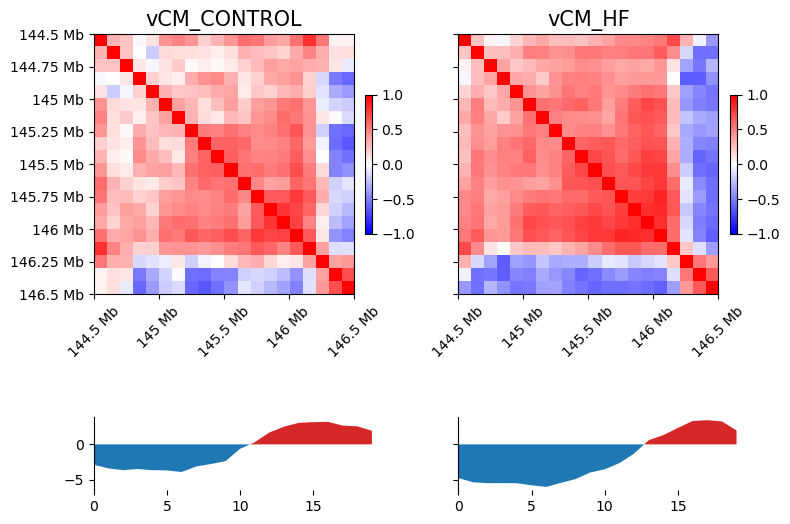

In [22]:
comp = pd.read_csv("../04.matrices/comp/FNIH_heart_dhc_celltype_HF_comp.impute.csv", index_col = 0)

nchrom = 4
chrom = f'chr{nchrom+1}'
res = 100_000
l, r = 144_500_000, 146_500_000 
ll, rr = int(l/res), int(r/res)
region = (chrom, l, r)
n_bins = (int(chrom_sizes.loc[chrom]) // res + 1)

fig, axes = plt.subplots(2, 2, figsize=(8, 6), gridspec_kw={'height_ratios':[3, 0.5]}, sharey="row")
leg = ['vCM_CONTROL', 'vCM_HF']
for i, ct in enumerate(leg):
    binfilter = binall[nchrom][ll:rr]
    ir = i // 2
    ic = i % 2
    ax = axes[0, ic]
    cool = cooler.Cooler(f'../04.matrices/impute/cool/{ct}_100kb.cool::/')
    Q = cool.matrix(balance=False, sparse=True).fetch(chrom).toarray()
    Q = Q - np.diag(np.diag(Q))
    Q = Q[ll:rr, ll:rr]
    Q = Q[binfilter][:, binfilter]
    decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
    E = np.zeros(Q.shape)
    row, col = np.diag_indices(E.shape[0])
    E[row, col] = 1
    for i in range(1, E.shape[0]):
        E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
    E = E + E.T
    C = np.corrcoef(np.log2(E + 0.001))
    im = ax.imshow(C, cmap='bwr', vmin = -1, vmax = 1, # LogNorm(vmin = 0.0001, vmax = 0.03), 
                   extent = (ll*res, rr*res, rr*res, ll*res))
    format_ticks(ax)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)
    ax.set_title(f'{ct}', fontsize=15)
    
    ax = axes[1, ic]
    binfilter = binall[nchrom][ll:rr]    
    sns.despine(bottom = True, ax = ax)
    tmp = comp.loc[(comp.index.str.split('-').str[0] == chrom) & (comp.index.str.split('-').str[1].astype(int) >= ll*res) & (comp.index.str.split('-').str[1].astype(int) < rr*res), ct]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    x, y = np.arange(len(tmp)), tmp
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)
    ax.set_xlim(0, rr - ll -1) ### 100kb
#     ax.set_ylabel(ct, fontsize = 12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
   

plt.tight_layout()
plt.savefig(f"plot/FIG_FNIH_heart_vCM_HF_Control_{chrom}_{ll}_{rr}_100kb_corr.pdf")

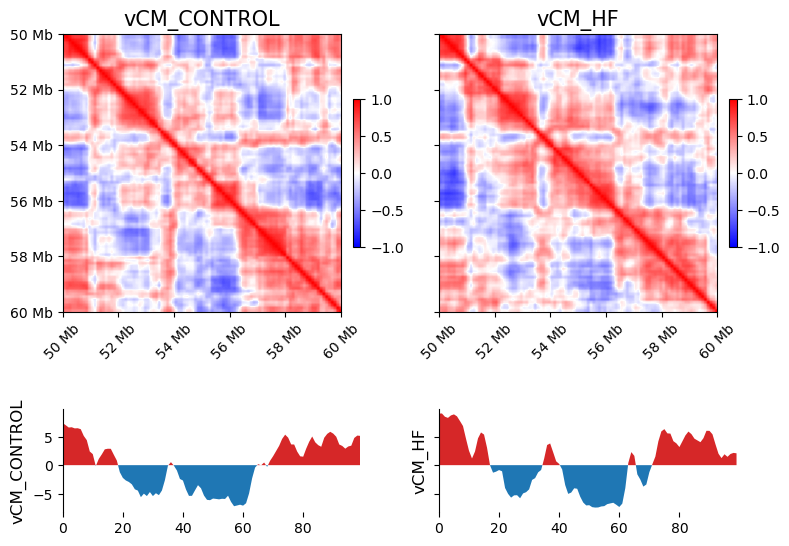

In [68]:
res = 100_000
l, r = 50_000_000, 60_000_000 
ll, rr = int(l/res), int(r/res)
region = (chrom, l, r)

fig, axes = plt.subplots(2, 2, figsize=(8, 6), gridspec_kw={'height_ratios':[2, 0.5]}, sharey="row")
for i, ct in enumerate(leg):
    binfilter = binall[nchrom][ll:rr]
    ir = i // 2
    ic = i % 2
    ax = axes[0, ic]
    cool = cooler.Cooler(f'../04.matrices/impute/cool/{ct}_100kb.cool::/')
    Q = cool.matrix(balance=False, sparse=True).fetch(chrom).toarray()
    Q = Q - np.diag(np.diag(Q))
    Q = Q[ll:rr, ll:rr]
    Q = Q[binfilter][:, binfilter]
    decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
    E = np.zeros(Q.shape)
    row, col = np.diag_indices(E.shape[0])
    E[row, col] = 1
    for i in range(1, E.shape[0]):
        E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
    E = E + E.T
    C = np.corrcoef(np.log2(E + 0.001))
    im = ax.imshow(C, cmap='bwr', vmin = -1, vmax = 1, # LogNorm(vmin = 0.0001, vmax = 0.03), 
                   extent = (ll*res, rr*res, rr*res, ll*res))
    format_ticks(ax)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)
    ax.set_title(f'{ct}', fontsize=15)
    
    ax = axes[1, ic]
    binfilter = binall[nchrom][ll:rr]    
    sns.despine(bottom = True, ax = ax)
    tmp = comp.loc[(comp.index.str.split('-').str[0] == chrom) & (comp.index.str.split('-').str[1].astype(int) >= ll*res) & (comp.index.str.split('-').str[1].astype(int) < rr*res), ct]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    x, y = np.arange(len(tmp)), tmp
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)
    ax.set_xlim(0, rr - ll -1) ### 100kb
    
    ax.set_ylabel(ct, fontsize = 12)

plt.subplots_adjust(hspace=0.2)
plt.tight_layout()
# plt.savefig(f"P4CC3_tumor_nontumor_{chrom}_{ll}_{rr}_100kb_balanced_contacts.pdf")

In [33]:
comp2 = pd.read_csv("../04.matrices/comp/impute/disease/dchic/DifferentialResult/fdr_result/differential.intra_sample_combined.pcQnm.bedGraph", sep = '\t')
comp2.index = comp2['chr'] + "-" + comp2['start'].astype(str) + "-" + comp2['end'].astype(str)
comp2 = comp2[comp.columns]

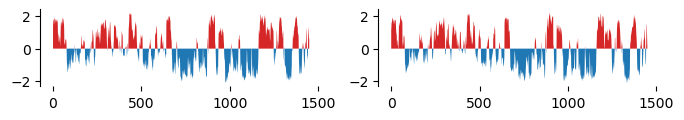

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(8, 1))
c = 'chr7'
ct = 'vCM'

Call = []
pcall = []
for k, ctt in enumerate([f'{ct}_CONTROL', f'{ct}_HF']):
    binfilter = binall[6]
    ax = axes[k]
    sns.despine(bottom=True, ax=ax)
    tmp = comp2.loc[(comp2.index.str.split('-').str[0] == "chr7"), ctt]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    pcall.append(tmp.values) ### tmp.iloc[np.where(binfilter)[0]].values
    
    x, y = np.arange(len(pcall[k])), pcall[k]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)

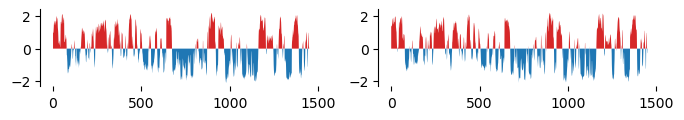

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(8, 1))
c = 'chr7'
ct = 'Myeloid'

Call = []
pcall = []
for k, ctt in enumerate([f'{ct}_CONTROL', f'{ct}_HF']):
    binfilter = binall[6]
    ax = axes[k]
    sns.despine(bottom=True, ax=ax)
    tmp = comp2.loc[(comp2.index.str.split('-').str[0] == "chr7"), ctt]
    # tmp.index = [int(xx.split('-')[1]) for xx in tmp.index]
    pcall.append(tmp.values) ### tmp.iloc[np.where(binfilter)[0]].values
    
    x, y = np.arange(len(pcall[k])), pcall[k]
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)

In [ ]:
### Plot all compartments


### Calculate per donor

In [221]:
legs = [file.replace('_100kb.cool', '') for file in os.listdir("../04.matrices/impute/cool/DONOR/")]
sad = np.zeros((len(legs), 50, 50))
count = np.zeros((len(legs), 50, 50))
comp = []

cpu = 8
with ProcessPoolExecutor(cpu) as executor:
    futures = {}
    for t,ct in enumerate(legs):
        cool = cooler.Cooler(f'../04.matrices/impute/cool/DONOR/{ct}_100kb.cool')
        future = executor.submit(
            compsaddle,
            cool=cool,
        )
        futures[future] = t

    for future in as_completed(futures):
        try:
            t = futures[future]  # Raises exception if the function failed
            ct = legs[t]
            xx, yy, zz = future.result()
            comp.append(pd.Series(xx, name=ct))
            sad[t] += yy
            count[t] += zz
            print(f'{ct} finished')
        except KeyError:
            print(f'{ct} failed')
            pass
        
### normalize
sad = sad / count

D52_Epicardial_CONTROL finished
D52_Endocardial_CONTROL finished
DTX031_Neuronal_HF finished
DTX105_Neuronal_HF finished
D47_Adipocyte_CONTROL finished
DTX119_SM_HF finished
DTX088_Epicardial_HF finished
DTX087_Endothelial_HF finished
DTX093_aCM_HF finished
D55_vCM_CONTROL finished
DTX081_Fibroblast_HF finished
D52_Lymphoid_CONTROL finished
DTX031_Adipocyte_HF finished
DTX077_Pericyte_HF finished
D38_Neuronal_CONTROL finished
DTX096_SM_HF finished
DTX105_Endothelial_HF finished
DTX065_Epicardial_HF finished
DTX093_Fibroblast_HF finished
DTX031_Fibroblast_HF finished
DTX093_Lymphoid_HF finished
D55_aCM_CONTROL finished
DTX066_vCM_HF finished
DTX065_vCM_HF finished
DTX114_Neuronal_HF finished
DTX088_Pericyte_HF finished
DTX093_Endothelial_HF finished
DTX077_Adipocyte_HF finished
D47_Endocardial_CONTROL finished
D40_Lymphoid_CONTROL finished
DTX062_aCM_HF finished
D38_Myeloid_CONTROL finished
DTX062_Endothelial_HF finished
DTX087_Pericyte_HF finished
DTX097_Epicardial_HF finished
DTX091_E

DTX089_aCM_HF finished
DTX027_Adipocyte_HF finished
DTX081_Neuronal_HF finished
DTX037_Myeloid_HF finished
D38_vCM_CONTROL finished
DTX027_Lymphoid_HF finished
DTX096_Neuronal_HF finished
D40_vCM_CONTROL finished
DTX081_vCM_HF finished
DTX089_SM_HF finished
D38_Pericyte_CONTROL finished
DTX062_Adipocyte_HF finished
DTX088_Fibroblast_HF finished
D55_Endocardial_CONTROL finished
DTX089_Adipocyte_HF finished
DTX097_SM_HF finished
D53_SM_CONTROL finished
DTX087_SM_HF finished
DTX037_Endocardial_HF finished
D40_Adipocyte_CONTROL finished
DTX062_Lymphoid_HF finished
DTX037_Adipocyte_HF finished
DTX027_SM_HF finished
DTX097_Myeloid_HF finished
DTX060_aCM_HF finished
DTX017_Fibroblast_HF finished
DTX077_Myeloid_HF finished
D47_Neuronal_CONTROL finished
D36_vCM_CONTROL finished
DTX060_Epicardial_HF finished
DTX088_Adipocyte_HF finished


In [151]:
bins_df = cool.bins()[:]
bins_df.index = bins_df['chrom'].astype(str) + '-' + bins_df['start'].astype(str) + '-' + bins_df['end'].astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index)])

comp = pd.concat(comp, axis=1)
comp.index = compidx

/tmp/ipykernel_3048110/2869429294.py:9: RuntimeWarning: invalid value encountered in divide
  sad = sad / count


In [230]:
ws = 10
compstr = [[sad[i][:ws, :ws].mean(), sad[i][-ws:, -ws:].mean(), sad[i][:ws, -ws:].mean(), sad[i][-ws:, :ws].mean(), 
            (sad[i][:ws, :ws].sum() + sad[i][-ws:, -ws:].sum()) / (sad[i][:ws, -ws:].sum() + sad[i][-ws:, :ws].sum())]
            for i in range(len(legs))]
compstr = pd.DataFrame(compstr, index=legs, columns=['BB', 'AA', 'BA', 'AB', 'strength'])
compstr.to_csv(f'../04.matrices/comp/FNIH_heart_dhc_donor_celltype_HF_compstr.impute.csv')

In [229]:
len(legs)

324

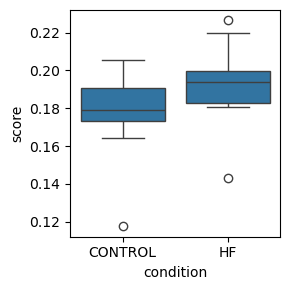

In [155]:
compfuse = pd.DataFrame(compstr['AB']/(compstr['AA'] + compstr['BB']), columns=['score'])
compfuse[['celltype', 'condition']] = compfuse.index.to_series().str.split('_', expand = True)

fig, ax = plt.subplots(figsize=(3, 3), sharex='all')
sns.boxplot(data=compfuse, x='condition', y='score', ax=ax)
plt.tight_layout()

In [243]:
## Now check decay by distance: raw matrix
res = 10000
chromsizes = bioframe.fetch_chromsizes('hg38')[:22]
cens = bioframe.fetch_centromeres('hg38')[:22]
arms = bioframe.make_chromarms(chromsizes, cens)

cvd = []
for idx, ct in enumerate(leg):
    clr = cooler.Cooler(f'../04.matrices/raw/cool/{ct}.mcool::/resolutions/{res}')
    tmp = cooltools.expected_cis(clr = clr, view_df = arms, smooth = True, aggregate_smoothed = True, nproc = 4, ignore_diags = 0)
    tmp['s_bp'] = tmp['dist']* res
    cvd.append(tmp)

In [ ]:
f, ax = plt.subplots(1,1)
region = "chr1_p"

for idx, ct in enumerate(leg[21:]):
    tmp = cvd[idx]
    ax.loglog(tmp['s_bp'].loc[tmp['region1']==region],
              tmp['balanced.avg.smoothed.agg'].loc[tmp['region1']==region], label = ct)
ax.legend()
ax.set(xlabel='separation, bp', ylabel='IC contact frequency')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_aspect(1.0)
ax.grid(lw=0.5)
plt.savefig(f'plot/FIG_CONTROL_vs_HF_vCM_decay.pdf')

## Calculate decay by compartment

In [246]:
# Use bioframe to fetch the genomic features from the UCSC.
hg38_chromsizes = bioframe.fetch_chromsizes('hg38')
hg38_cens = bioframe.fetch_centromeres('hg38')

hg38_arms = bioframe.make_chromarms(hg38_chromsizes,  hg38_cens)
hg38_arms = hg38_arms[hg38_arms.chrom.isin(['chr' + str(i) for i in range(1, 23)])].reset_index(drop=True)

In [249]:
current = "../04.matrices/raw/cool/"
res = 10_000

cdk = []
for ctf in comp.columns:
    clr = cooler.Cooler(current + f"{ctf}.mcool::resolutions/{res}")
    dcay = cooltools.expected_cis(clr, hg38_arms, intra_only=True, 
                                  smooth=True, aggregate_smoothed=True, smooth_sigma=0.1, 
                                  clr_weight_name='weight', ignore_diags=1, chunksize=10000000, nproc=16)
    dcay['celltype'] = ctf
    cdk.append(dcay)
    
cdk = pd.concat(cdk, axis=0, ignore_index=True)
cdk.to_csv("plot/FIG_all_celltype_condition_decay.csv")

In [250]:
current = "../04.matrices/raw/cool/young/"
import pybedtools

adk = []
for ctf in comp.columns:
    print(ctf)
    tmp = comp.loc[comp[ctf] > 0].index ### A compartment

    bed_df = pd.DataFrame([x.split('-') for x in tmp], columns=['chrom', 'start', 'end'])
    bed_df['start'] = bed_df['start'].astype(int)
    bed_df['end'] = bed_df['end'].astype(int)

    ### get only chr1q for calculation
    bed_df = bed_df.loc[(bed_df['chrom'] == hg38_arms.iloc[1]['chrom']) & (bed_df['start'] >= hg38_arms.iloc[1]['start']) & (bed_df['end'] <= hg38_arms.iloc[1]['end'])]

    ### collapase contingent regions
    bedtool = pybedtools.BedTool.from_dataframe(bed_df)
    merged = bedtool.merge()
    bed_df = merged.to_dataframe()
    bed_df['name'] = bed_df.index.astype(str)

    clr = cooler.Cooler(current + f"{ctf}.mcool::resolutions/{res}")
    dcay = cooltools.expected_cis(clr, bed_df, intra_only=False, smooth=True, aggregate_smoothed=True, smooth_sigma=0.1, 
                        clr_weight_name='weight', ignore_diags=2, chunksize=10000000, nproc=16)
    dcay['celltype'] = ctf
    adk.append(dcay)
    
adk = pd.concat(adk, axis=0, ignore_index=True)

Epicardial_HF
Adipocyte_CONTROL
Epicardial_CONTROL
Endothelial_CONTROL
Endocardial_HF
Adipocyte_HF
Endocardial_CONTROL
Endothelial_HF
Fibroblast_CONTROL
Lymphoid_CONTROL
Lymphoid_HF
Fibroblast_HF
Myeloid_HF
Neuronal_CONTROL
Myeloid_CONTROL
Neuronal_HF
Pericyte_CONTROL
Pericyte_HF
aCM_CONTROL
SM_CONTROL
SM_HF
aCM_HF
vCM_HF
vCM_CONTROL


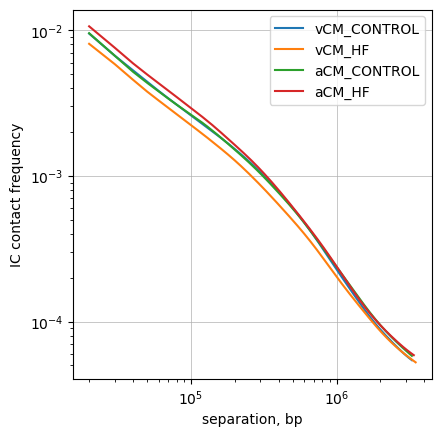

In [251]:
### Plot decay in A compartment
f, ax = plt.subplots(1,1)
for ctf in ['vCM_CONTROL', 'vCM_HF', 'aCM_CONTROL', 'aCM_HF']:
    cvd_smooth_agg = adk.loc[adk['celltype'] == ctf]
    cvd_smooth_agg['dist_bp'] = cvd_smooth_agg['dist'] * res
    cvd_smooth_agg['balanced.avg.smoothed.agg'].loc[cvd_smooth_agg['dist'] < 2] = np.nan
    qarm = cvd_smooth_agg['region1'].mode().iloc[0]
    qdf = cvd_smooth_agg.loc[cvd_smooth_agg['region1'] == qarm]

    ax.loglog(qdf['dist_bp'].loc[qdf['region2'] == qarm],
              qdf['balanced.avg.smoothed.agg'].loc[qdf['region2'] == qarm], 
              label = ctf)
    
ax.legend()
ax.set(xlabel='separation, bp', ylabel='IC contact frequency')
ax.set_aspect(1.0)
ax.grid(lw=0.5)

In [252]:
bdk = []
for ctf in comp.columns:
    tmp = comp.loc[comp[ctf] < 0].index ### A compartment

    bed_df = pd.DataFrame([x.split('-') for x in tmp], columns=['chrom', 'start', 'end'])
    bed_df['start'] = bed_df['start'].astype(int)
    bed_df['end'] = bed_df['end'].astype(int)

    ### get only chr1q for calculation
    bed_df = bed_df.loc[(bed_df['chrom'] == 'chr1') & (bed_df['start'] >= hg38_arms.iloc[1]['start']) & (bed_df['end'] <= hg38_arms.iloc[1]['end'])]

    ### collapase contingent regions
    bedtool = pybedtools.BedTool.from_dataframe(bed_df)
    merged = bedtool.merge()
    bed_df = merged.to_dataframe()
    bed_df['name'] = bed_df.index.astype(str)

    clr = cooler.Cooler(current + f"{ctf}.mcool::resolutions/{res}")
    dcay = cooltools.expected_cis(clr, bed_df, intra_only=False, smooth=True, 
                                  aggregate_smoothed=True, smooth_sigma=0.1, 
                                  clr_weight_name='weight', ignore_diags=2, chunksize=10000000, nproc=16)
    dcay['celltype'] = ctf
    bdk.append(dcay)
    
bdk = pd.concat(bdk, axis=0, ignore_index=True)

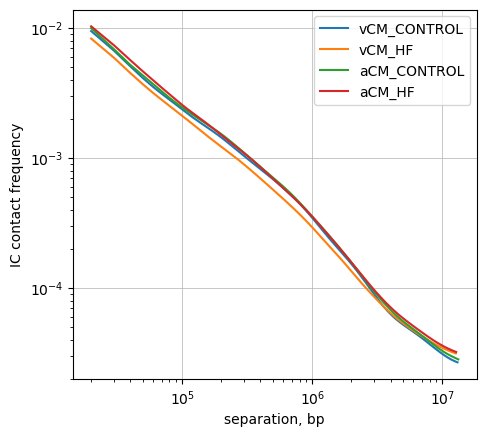

In [253]:
### Plot decay in B compartment
f, ax = plt.subplots(1,1)
for ctf in ['vCM_CONTROL', 'vCM_HF', 'aCM_CONTROL', 'aCM_HF']:
    cvd_smooth_agg = bdk.loc[bdk['celltype'] == ctf]
    cvd_smooth_agg['dist_bp'] = cvd_smooth_agg['dist'] * res
    cvd_smooth_agg['balanced.avg.smoothed.agg'].loc[cvd_smooth_agg['dist'] < 2] = np.nan
    qarm = cvd_smooth_agg['region1'].mode().iloc[0]
    qdf = cvd_smooth_agg.loc[cvd_smooth_agg['region1'] == qarm]

    ax.loglog(qdf['dist_bp'].loc[qdf['region2'] == qarm],
              qdf['balanced.avg.smoothed.agg'].loc[qdf['region2'] == qarm], 
              label = ctf)
    
ax.legend()
ax.set(xlabel='separation, bp', ylabel='IC contact frequency')
ax.set_aspect(1.0)
ax.grid(lw=0.5)

In [254]:
adk.to_csv("plot/FIG_all_celltype_condition_decay_in_Acomp.young.csv")
bdk.to_csv("plot/FIG_all_celltype_condition_decay_in_Bcomp.young.csv")

In [208]:
### How about all?
dk = []
for ctf in comp.columns:
    clr = cooler.Cooler(current + f"{ctf}.mcool::resolutions/{res}")
    dcay = cooltools.expected_cis(clr, hg38_arms, intra_only=True, 
                                  smooth=True, aggregate_smoothed=True, smooth_sigma=0.1, 
                                  clr_weight_name='weight', ignore_diags=1, chunksize=10000000, nproc=16)
    dcay['celltype'] = ctf
    dk.append(dcay)
    
dk = pd.concat(dk, axis=0, ignore_index=True)
# dk.to_csv("plot/FIG_all_celltype_condition_decay.csv")

In [220]:
korder = ['vCM_HF', 'vCM_CONTROL',
           'aCM_HF', 'aCM_CONTROL']

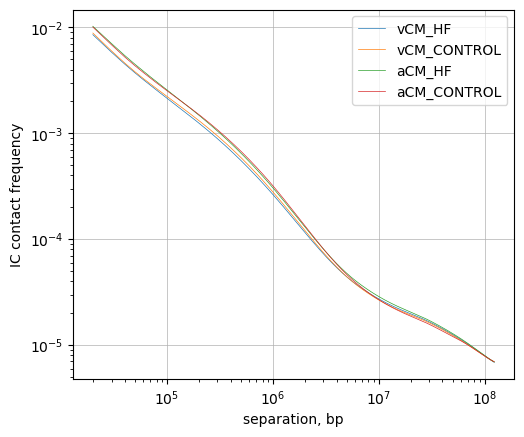

In [222]:
f, ax = plt.subplots(1,1)
for ctf in korder:
    cvd_smooth_agg = dk.loc[dk['celltype'] == ctf]
    cvd_smooth_agg['dist_bp'] = cvd_smooth_agg['dist'] * res
    cvd_smooth_agg['balanced.avg.smoothed.agg'].loc[cvd_smooth_agg['dist'] < 2] = np.nan
    qdf = cvd_smooth_agg.loc[cvd_smooth_agg['region1'] == 'chr1_p']
    ax.loglog(qdf['dist_bp'], qdf['balanced.avg.smoothed.agg'], label = ctf, linewidth = 0.5)
    
ax.legend()
ax.set(xlabel='separation, bp', ylabel='IC contact frequency')
ax.set_aspect(1.0)
ax.grid(lw=0.5)

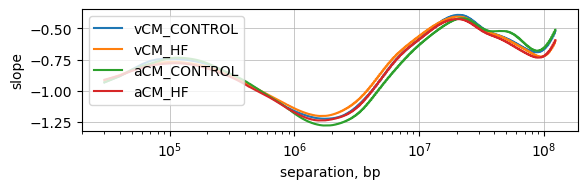

In [225]:
f, ax = plt.subplots(1,1)
for ctf in ['vCM_CONTROL', 'vCM_HF', 'aCM_CONTROL', 'aCM_HF']:
    cvd_smooth_agg = dk.loc[dk['celltype'] == ctf]
    cvd_smooth_agg['dist_bp'] = cvd_smooth_agg['dist'] * res
    cvd_smooth_agg['balanced.avg.smoothed.agg'].loc[cvd_smooth_agg['dist'] < 2] = np.nan
    qdf = cvd_smooth_agg.loc[cvd_smooth_agg['region1'] == "chr1_p"]
    
    der = np.gradient(np.log(qdf['balanced.avg.smoothed.agg']), np.log(qdf['dist_bp']))
    
    ax.semilogx(qdf['dist_bp'], der, label = ctf)
    
ax.legend()
ax.set(xlabel='separation, bp', ylabel='slope')
ax.set_aspect(1.0)
ax.grid(lw=0.5)

### slope looks strange

### Check whether decay is affected by cell number?

In [184]:
clr = cooler.Cooler("../04.matrices/FNIH_heart_dhc.mcool::resolutions/10000")

# create downsampled test data
from multiprocessing import Pool
downsampling_fracs = [0.0001, 0.001, 0.01, 0.1]
num_reads = {}
cvds = {}
cvds_smoothed = {}
derivs_smoothed = {}

p = Pool(16)
for frac in downsampling_fracs:
    cooltools.sample(clr, out_clr_path=f'../04.matrices/subsample/FNIH_heart_dhc_sampled_{frac}_10000.cool', frac=frac)
    clr_downsampled = cooler.Cooler(f'../04.matrices/subsample/FNIH_heart_dhc_sampled_{frac}_10000.cool')
    result = cooler.balance_cooler(clr_downsampled, map=p.map, store=True, min_nnz=0)
p.close()
p.terminate()

In [ ]:
clr = cooler.Cooler("../04.matrices/FNIH_heart_dhc.mcool::resolutions/10000")
cvd_smooth_agg_raw = cooltools.expected_cis(
    clr=clr,
    view_df=hg38_arms[1:2],
    smooth=True,
    aggregate_smoothed=True,
    nproc=16)

In [194]:
cvds[1] = cvd_smooth_agg_raw
num_reads[1] = cvd_smooth_agg_raw['count.sum'].sum().astype(int)

In [186]:
for frac in downsampling_fracs:
    clr_downsampled = cooler.Cooler(f'../04.matrices/subsample/FNIH_heart_dhc_sampled_{frac}_10000.cool')
    cvd_downsampled = cooltools.expected_cis(
        clr=clr_downsampled,
        view_df=hg38_arms[1:2],
#         clr_weight_name=None,
        smooth=True,
        aggregate_smoothed=True,
        nproc=16)
    cvds[frac] = cvd_downsampled
    num_reads[frac] = cvd_downsampled['count.sum'].sum().astype(int)

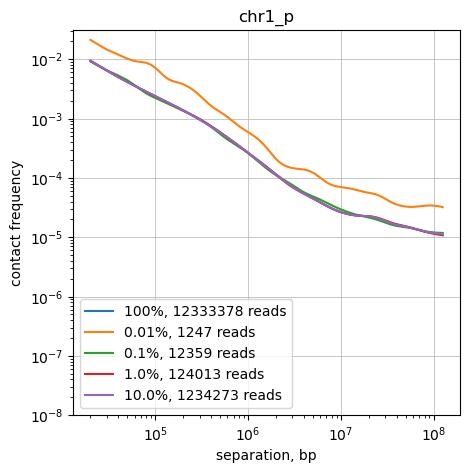

In [201]:
f, ax = plt.subplots(1,1, figsize=(5, 5))

region = hg38_arms['name'][0]
for frac in [1]+downsampling_fracs:
    cvd_downsampled = cvds[frac]
    cvd_downsampled['dist_bp'] = cvd_downsampled['dist'] * res
    cvd_downsampled['balanced.avg.smoothed.agg'].loc[cvd_downsampled['dist'] < 2] = np.nan
    
    ax.loglog(
        cvd_downsampled['dist_bp'],
        cvd_downsampled['balanced.avg.smoothed.agg'],
        label=f'{frac*100}%, {num_reads[frac]} reads',
    )

ax.set(
    xlabel='separation, bp',
    ylabel='contact frequency')
ax.grid(lw=0.5)
ax.legend()
ax.title.set_text(region)
ax.set_ylim(ymin=10**(-8))
f.show()

In [203]:
### How many reads do other libararies have?
### safe! decay not affected by read count
dk.groupby('celltype')['count.sum'].sum()

celltype
Adipocyte_CONTROL        412195.0
Adipocyte_HF             764726.0
Endocardial_CONTROL     1016625.0
Endocardial_HF          1064403.0
Endothelial_CONTROL     6812666.0
Endothelial_HF         15704451.0
Epicardial_CONTROL       228551.0
Epicardial_HF            697960.0
Fibroblast_CONTROL     14150540.0
Fibroblast_HF          37382756.0
Lymphoid_CONTROL        1034785.0
Lymphoid_HF             3649549.0
Myeloid_CONTROL         6250658.0
Myeloid_HF             14339795.0
Neuronal_CONTROL         693970.0
Neuronal_HF             1124643.0
Pericyte_CONTROL        2044410.0
Pericyte_HF             3952292.0
SM_CONTROL               778652.0
SM_HF                   1608991.0
aCM_CONTROL             6371915.0
aCM_HF                 11077847.0
vCM_CONTROL             6466064.0
vCM_HF                 12821316.0
Name: count.sum, dtype: float64

In [432]:
### comp by diagonal: do chr1 only
res = 100_000
i=1
chromp = f'chr{i}'

ctf = 'Myeloid_HF'
clr = cooler.Cooler(current + f"{ctf}.mcool::resolutions/{res}")  
matrix = clr.matrix(balance=True).fetch(chromp) #[:]

bdf = clr.bins()[:]
bdf = bdf.loc[bdf['chrom'] == chromp]
bdf['range'] = bdf[['chrom', 'start', 'end']].astype(str).agg('-'.join, axis=1)
# bdf = bdf.iloc[binall[i]]### need to match: as we filtered the bins before

pc1 = comp[ctf] 
pc1[pc1.index.str.startswith(f"{chromp}-")]
pc1 = bdf.merge(pc1, left_on = 'range', right_index = True, how = 'left') ### filter NaN later
pc1 = pc1[ctf].values

max_dist = 1000  # max diagonal to include (in bins)
mtx = []

for d in range(1, max_dist + 1):
    diag_vals = matrix.diagonal(offset=d)
    idx = np.arange(len(diag_vals))
    
    i = idx
    j = idx + d

    # Filter out NaNs and 0 from matrix or pc1
    valid = (
        ~np.isnan(diag_vals) & (diag_vals != 0) &
        ~np.isnan(pc1[i]) & (pc1[i] != 0) &
        ~np.isnan(pc1[j]) & (pc1[j] != 0)
    )
    
    if valid.sum() < 10:
        continue

    contacts = diag_vals[valid]
    arr = np.abs(pc1[i[valid]] - pc1[j[valid]])
    arr, _ = np.histogram(arr, bins=80, density=True)
    arr_scaled = (arr - np.min(arr)) / (np.max(arr) - np.min(arr) + 1e-10)  # avoid zero division
    mtx.append(arr_scaled)

dmtx1 = pd.DataFrame(mtx)

In [417]:
def smoothed(dmtx, new_rows = 80):
    mat = dmtx.to_numpy()
    chunk_size = mat.shape[0] // new_rows
    mat_trimmed = mat[:chunk_size * new_rows]
    smoothed = mat_trimmed.reshape(new_rows, chunk_size, -1).mean(axis=1)
    return smoothed

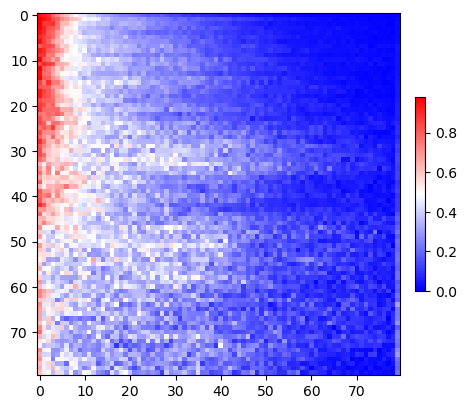

In [433]:
f, ax = plt.subplots(1,1, figsize=(5, 5))
im = ax.imshow(smoothed(dmtx1), cmap='bwr')#, vmin = -1, vmax = 1)
plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

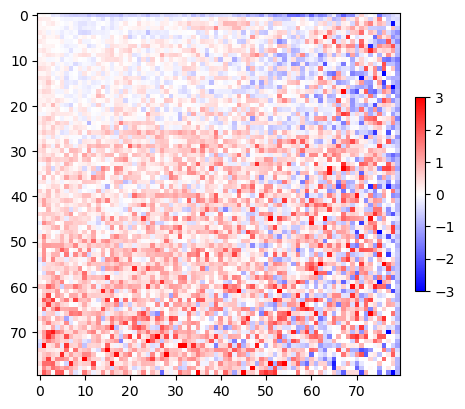

In [434]:
f, ax = plt.subplots(1,1, figsize=(5, 5))
im = ax.imshow(np.log2(smoothed(dmtx1)/smoothed(dmtx2)), cmap='bwr', vmin = -3, vmax = 3)
plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

## Single cell compartment score

In [134]:
import xarray
scomp = xarray.open_dataset("../impute/100K/comp/impute.compartment.nc")

In [165]:
scompf = scomp['compartment'].sel().to_pandas().T
scompf.index = scomp['bin_chrom'].values + ':' + scomp['bin_start'].values.astype(str) + '-' + scomp['bin_end'].values.astype(str)

In [168]:
scompf.T.to_csv("../impute/100K/comp/impute.compartment.csv")